<h1>Import Neccessary libraries</h1>

In [1]:
import pandas as pd
from pandas.tseries.offsets import MonthBegin

import numpy as np
from scipy import stats
import wquantiles
import scipy.stats as stats
import statsmodels as sm
from sklearn.utils import resample

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from fitter import Fitter, get_common_distributions, get_distributions

<h2>Loading Data</h2>

In [2]:
bansagar_df = pd.read_csv('../datasets/BansagarDam.csv')
indrapuri_df = pd.read_csv('../datasets/IndrapuriBarrage.csv')
chopan_df = pd.read_csv('../datasets/OldChopan.csv')
jawahar_df = pd.read_csv('../datasets/JawaharSetu.csv')

<h2>Data Preprocessing</h2>

In [3]:
bansagar_df = bansagar_df[['datetime', 'precip']]
indrapuri_df = indrapuri_df[['datetime', 'precip']]
chopan_df = chopan_df[['datetime', 'precip']]
jawahar_df = jawahar_df[['datetime', 'precip']]

In [4]:
bansagar_df.rename(columns={'precip': 'BDP'}, inplace=True)
indrapuri_df.rename(columns={'precip': 'IBP'}, inplace=True)
chopan_df.rename(columns={'precip': 'OCP'}, inplace=True)
jawahar_df.rename(columns={'precip': 'JSP'}, inplace=True)

In [5]:
final_frame = bansagar_df.merge(indrapuri_df, on='datetime').merge(chopan_df, on='datetime').merge(jawahar_df, on='datetime')

In [6]:
final_frame

,datetime,BDP,IBP,OCP,JSP
0,2010-01-01,0.0,0.0,0.0,0.0
1,2010-01-02,0.0,0.0,0.0,0.0
2,2010-01-03,0.0,0.0,0.0,0.0
3,2010-01-04,0.0,0.0,0.0,0.0
4,2010-01-05,0.0,0.0,0.0,0.0
...,...,...,...,...,...
4554,2022-06-21,3.5,9.8,1.0,0.2
4555,2022-06-22,1.1,1.0,0.0,0.1
4556,2022-06-23,3.5,0.9,1.5,0.5
4557,2022-06-24,6.3,4.1,2.9,1.8


In [7]:
final_frame['datetime'] = pd.to_datetime(final_frame['datetime'])
final_frame['year'] = final_frame['datetime'].dt.year
final_frame['month'] = final_frame['datetime'].dt.month
final_frame['dayofyear'] = final_frame['datetime'].dt.dayofyear
final_frame['winter'] = final_frame['month'].apply(lambda x: 1 if x in (12, 1, 2) else 0)
final_frame['summer'] = final_frame['month'].apply(lambda x: 1 if x in (3, 4, 5) else 0)
final_frame['monsoon'] = final_frame['month'].apply(lambda x: 1 if x in (6, 7, 8, 9) else 0)
final_frame['post_monsoon'] = final_frame['month'].apply(lambda x: 1 if x in (10, 11) else 0)

<h2>Data Visualization</h2>

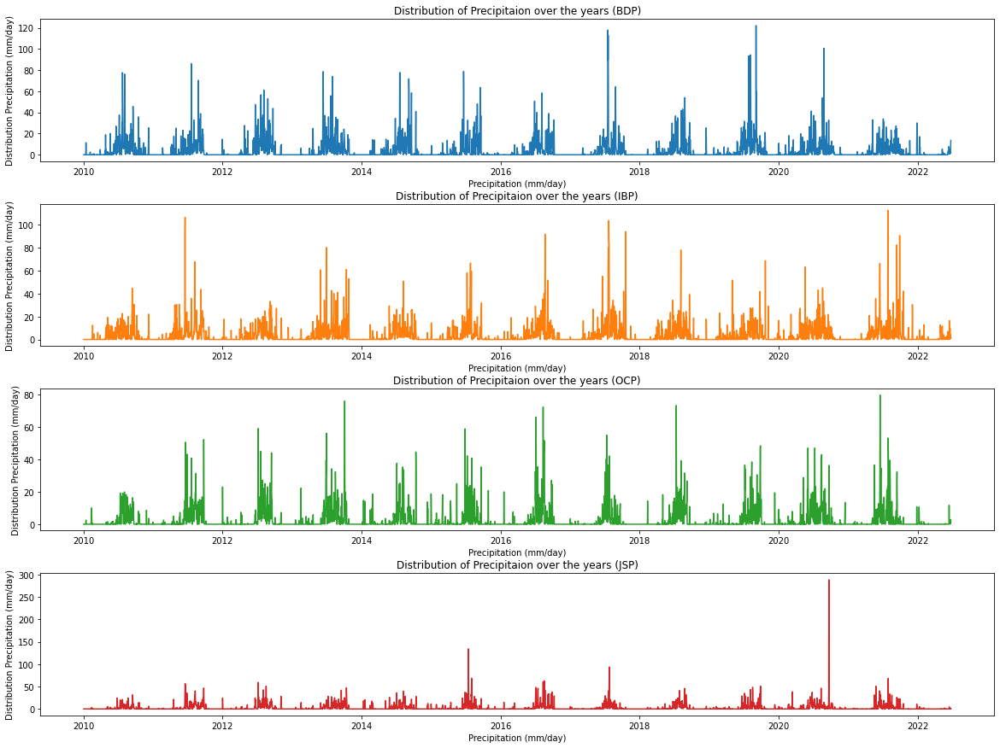

In [8]:
fig = plt.figure(figsize=(20, 15))
gs = fig.add_gridspec(4, hspace=0.3)
axs = gs.subplots(sharex=False, sharey=False)
axs[0].plot(final_frame['datetime'], final_frame['BDP'])
axs[1].plot(final_frame['datetime'], final_frame['IBP'], 'tab:orange')
axs[2].plot(final_frame['datetime'], final_frame['OCP'], 'tab:green')
axs[3].plot(final_frame['datetime'], final_frame['JSP'], 'tab:red')
axs[0].set(ylabel="Distribution Precipitation (mm/day)", xlabel="Precipitation (mm/day)", title='Distribution of Precipitaion over the years (BDP)')
axs[1].set(ylabel="Distribution Precipitation (mm/day)", xlabel="Precipitation (mm/day)", title='Distribution of Precipitaion over the years (IBP)')
axs[2].set(ylabel="Distribution Precipitation (mm/day)", xlabel="Precipitation (mm/day)", title='Distribution of Precipitaion over the years (OCP)')
axs[3].set(ylabel="Distribution Precipitation (mm/day)", xlabel="Precipitation (mm/day)", title='Distribution of Precipitaion over the years (JSP)')
plt.show()

We can see that the distribution of precipitation follows some seasonal pattern but there are some unusual spikes in certain stations and year. Jawahar Setu saw a huge spike in year 2020-2021.

In [10]:
df_year_gb_avg = final_frame.groupby('year').agg(BDP=('BDP', np.mean),
                                        IBP=('IBP', np.mean),
                                        OCP=('OCP', np.mean),
                                        JSP=('JSP', np.mean))

df_month_gb_avg = final_frame.groupby('month').agg(BDP=('BDP', np.mean),
                                        IBP=('IBP', np.mean),
                                        OCP=('OCP', np.mean),
                                        JSP=('JSP', np.mean))

df_dayofyear_gb_avg = final_frame.groupby('dayofyear').agg(BDP=('BDP', np.mean),
                                        IBP=('IBP', np.mean),
                                        OCP=('OCP', np.mean),
                                        JSP=('JSP', np.mean))

Similarly, we can look at process that vary of the course of a day or a year by averaging all the hours of a day or days of a year together

In [11]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_year_gb_avg.index, y=df_year_gb_avg['BDP'],
                    mode='lines+markers',
                    name='Year vs Precipitation (BDP)'))
fig.add_trace(go.Scatter(x=df_year_gb_avg.index, y=df_year_gb_avg['IBP'],
                    mode='lines+markers',
                    name='Year vs Precipitation (IBP)'))
fig.add_trace(go.Scatter(x=df_year_gb_avg.index, y=df_year_gb_avg['OCP'],
                    mode='lines+markers',
                    name='Year vs Precipitation (OCP)'))
fig.add_trace(go.Scatter(x=df_year_gb_avg.index, y=df_year_gb_avg['JSP'],
                    mode='lines+markers',
                    name='Year vs Precipitation (JSP)'))
fig.update_layout(
    title='Average Yearly Precipitation (mm/day)',
    font_family='Courier New',
    font_color='blue',
    title_font_family='Times New Roman',
    title_font_color='red',
    legend_title_font_color='green'
)
fig.update_xaxes( 
        title_text = 'Year',
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = 'Average Precipitation (mm/day)',
        title_standoff = 20)

In [12]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_month_gb_avg.index, y=df_month_gb_avg['BDP'],
                    mode='lines+markers',
                    name='Month vs Precipitation (BDP)'))
fig.add_trace(go.Scatter(x=df_month_gb_avg.index, y=df_month_gb_avg['IBP'],
                    mode='lines+markers',
                    name='Month vs Precipitation (IBP)'))
fig.add_trace(go.Scatter(x=df_month_gb_avg.index, y=df_month_gb_avg['OCP'],
                    mode='lines+markers',
                    name='Month vs Precipitation (OCP)'))
fig.add_trace(go.Scatter(x=df_month_gb_avg.index, y=df_month_gb_avg['JSP'],
                    mode='lines+markers',
                    name='Month vs Precipitation (JSP)'))
fig.update_layout(
    title='Average Monthly Precipitation (mm/day)',
    font_family='Courier New',
    font_color='blue',
    title_font_family='Times New Roman',
    title_font_color='red',
    legend_title_font_color='green'
)
fig.update_xaxes( 
        title_text = 'Month',
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = 'Average Precipitation (mm/day)',
        title_standoff = 20)

In [13]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_dayofyear_gb_avg.index, y=df_dayofyear_gb_avg['BDP'],
                    mode='lines+markers',
                    name='Day vs Precipitation (BDP)'))
fig.add_trace(go.Scatter(x=df_dayofyear_gb_avg.index, y=df_dayofyear_gb_avg['IBP'],
                    mode='lines+markers',
                    name='Day vs Precipitation (IBP)'))
fig.add_trace(go.Scatter(x=df_dayofyear_gb_avg.index, y=df_dayofyear_gb_avg['OCP'],
                    mode='lines+markers',
                    name='Day vs Precipitation (OCP)'))
fig.add_trace(go.Scatter(x=df_dayofyear_gb_avg.index, y=df_dayofyear_gb_avg['JSP'],
                    mode='lines+markers',
                    name='Day vs Precipitation (JSP)'))
fig.update_layout(
    title='Average Daily Precipitation (mm/day)',
    font_family='Courier New',
    font_color='blue',
    title_font_family='Times New Roman',
    title_font_color='red',
    legend_title_font_color='green'
)
fig.update_xaxes( 
        title_text = 'Day',
        title_font = {"size": 20},
        title_standoff = 25)

fig.update_yaxes(
        title_text = 'Average Precipitation (mm/day)',
        title_standoff = 20)

On average Bansagar Dam saw huge spike precipitation followed by Jawahar Setu

In [14]:
acf_plot_frame = final_frame[['datetime', 'BDP', 'IBP', 'OCP', 'JSP']]
acf_plot_frame = acf_plot_frame.set_index('datetime')

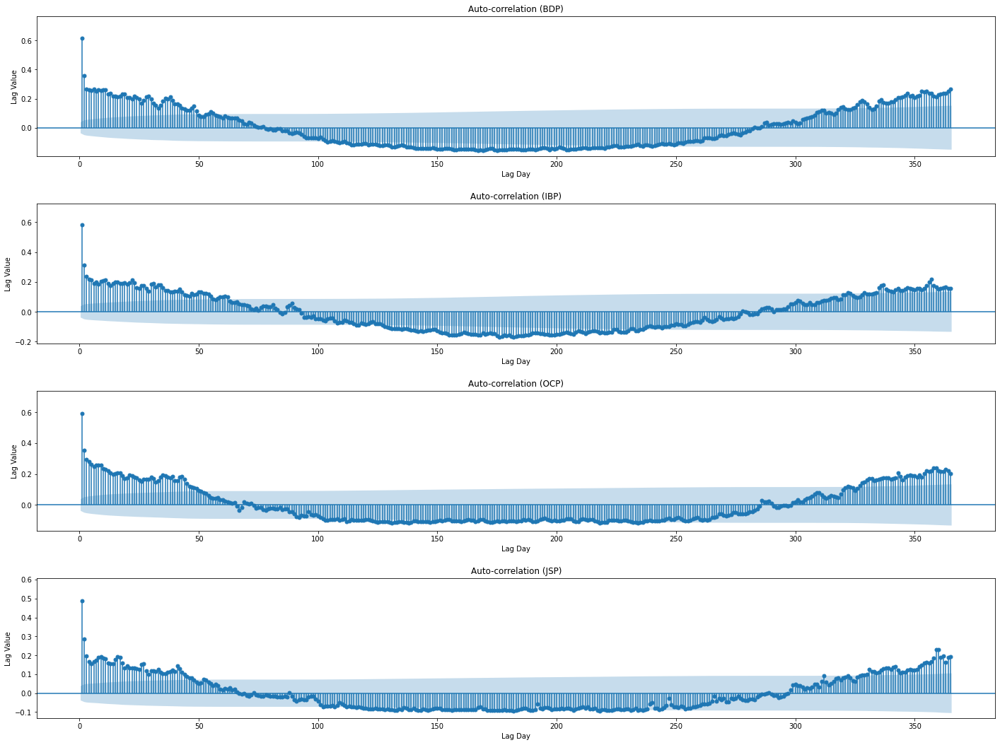

In [15]:
fig, ax = plt.subplots(4, figsize=(20, 15))
plot_acf(acf_plot_frame['BDP'].values, lags=365, alpha=0.01, zero=False, auto_ylims=True, title='Auto-correlation function plot for BDP', ax=ax[0])
plot_acf(acf_plot_frame['IBP'].values, lags=365, alpha=0.01, zero=False, auto_ylims=True, title='Auto-correlation function plot for IBP', ax=ax[1])
plot_acf(acf_plot_frame['OCP'].values, lags=365, alpha=0.01, zero=False, auto_ylims=True, title='Auto-correlation function plot for OCP', ax=ax[2])
plot_acf(acf_plot_frame['JSP'].values, lags=365, alpha=0.01, zero=False, auto_ylims=True, title='Auto-correlation function plot for JSP', ax=ax[3])
ax[0].set(ylabel='Lag Value', xlabel='Lag Day', title='Auto-correlation (BDP)')
ax[1].set(ylabel='Lag Value', xlabel='Lag Day', title='Auto-correlation (IBP)')
ax[2].set(ylabel='Lag Value', xlabel='Lag Day', title='Auto-correlation (OCP)')
ax[3].set(ylabel='Lag Value', xlabel='Lag Day', title='Auto-correlation (JSP)')
fig.tight_layout(pad=2)
plt.show()

We use acf to better understand the relationship of the series. It gives us the correlation of the series with its own lag. As we can see from the above graph,
when the number of lags increases the correlation decreases, after a certain point we observe that when the lag increases the correlation starts to increase.
This type of correlation occurs only if their is a similar pattern in the original time-series as well.All of the lags that are crossing the significance line are significance lags. They have a statistical relation with precipitation variable itself

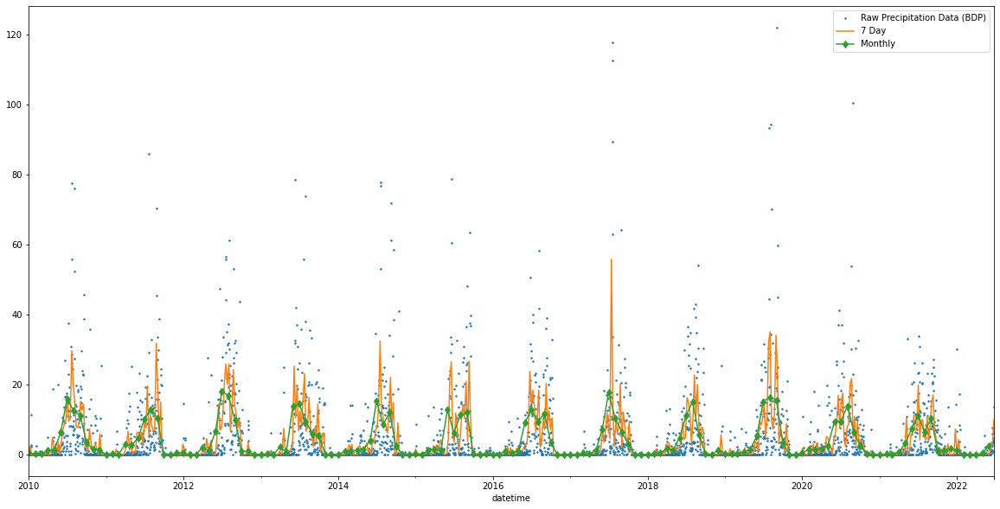

In [15]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
new_df = final_frame.set_index('datetime')
new_df['BDP'].plot(ax=ax,label='Raw Precipitation Data (BDP)', linestyle='None', marker='.', markersize=3)
new_df['BDP'].resample('7D').mean().plot(ax=ax,label='7 Day')
new_df['BDP'].resample('MS').mean().plot(ax=ax,label='Monthly',marker='d') 
plt.legend();

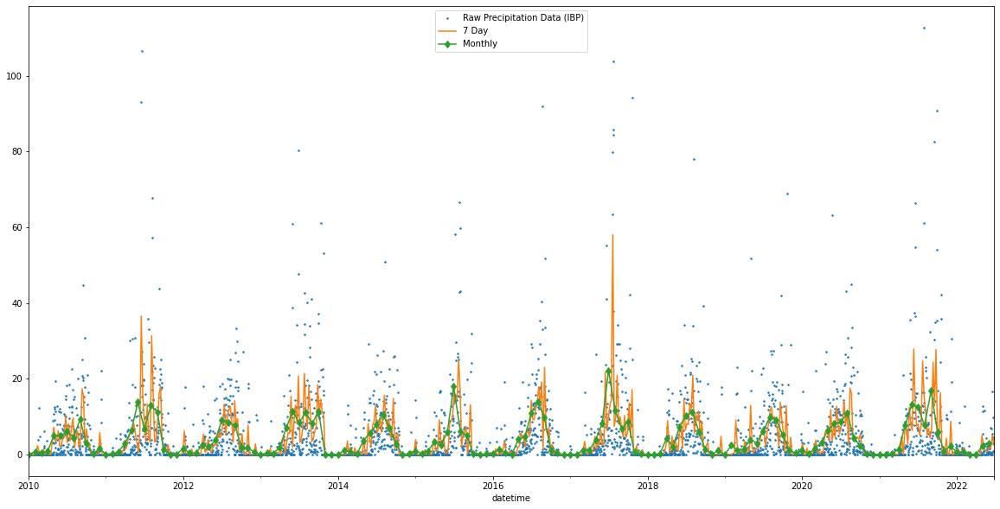

In [16]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
new_df = final_frame.set_index('datetime')
new_df['IBP'].plot(ax=ax,label='Raw Precipitation Data (IBP)', linestyle='None', marker='.', markersize=3)
new_df['IBP'].resample('7D').mean().plot(ax=ax,label='7 Day')
new_df['IBP'].resample('MS').mean().plot(ax=ax,label='Monthly',marker='d') 
plt.legend();

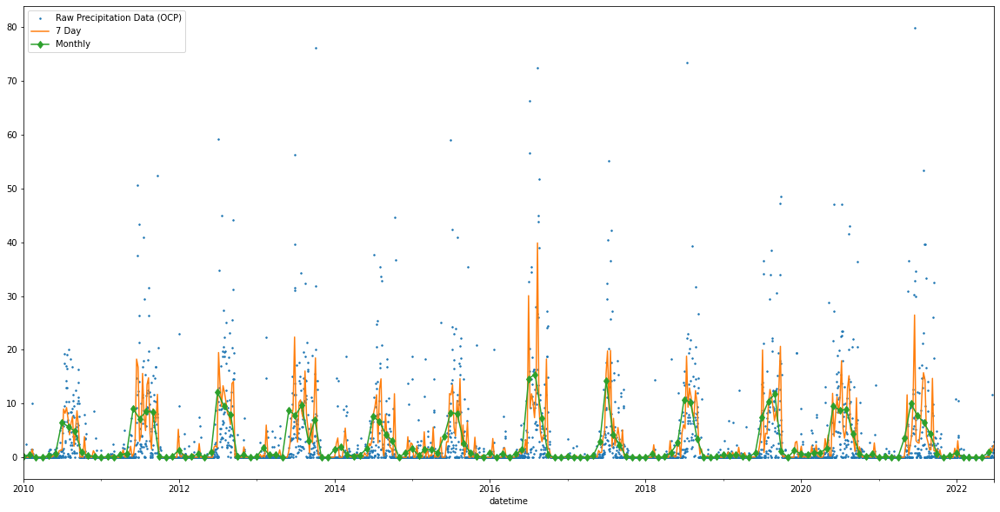

In [17]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
new_df = final_frame.set_index('datetime')
new_df['OCP'].plot(ax=ax,label='Raw Precipitation Data (OCP)', linestyle='None', marker='.', markersize=3)
new_df['OCP'].resample('7D').mean().plot(ax=ax,label='7 Day')
new_df['OCP'].resample('MS').mean().plot(ax=ax,label='Monthly',marker='d') 
plt.legend();

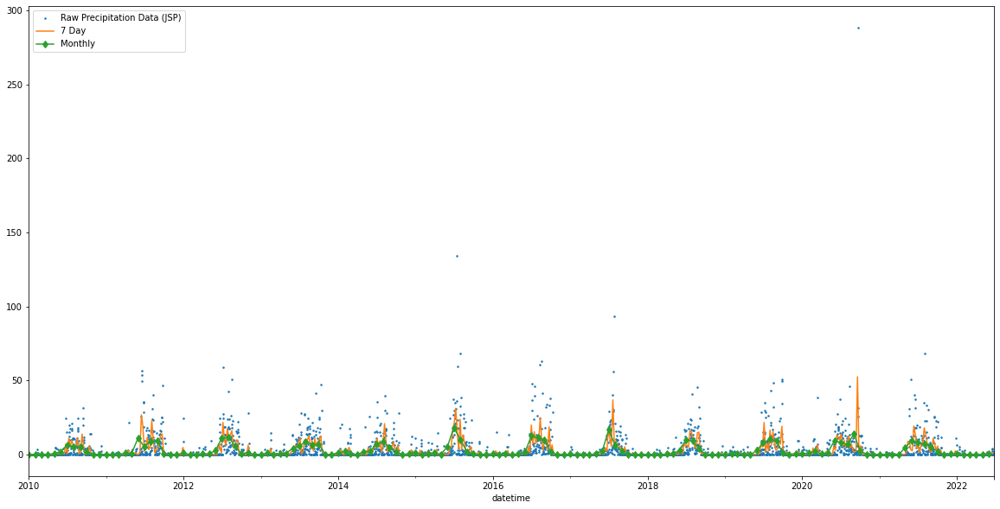

In [18]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
new_df = final_frame.set_index('datetime')
new_df['JSP'].plot(ax=ax,label='Raw Precipitation Data (JSP)', linestyle='None', marker='.', markersize=3)
new_df['JSP'].resample('7D').mean().plot(ax=ax,label='7 Day')
new_df['JSP'].resample('MS').mean().plot(ax=ax,label='Monthly',marker='d') 
plt.legend();

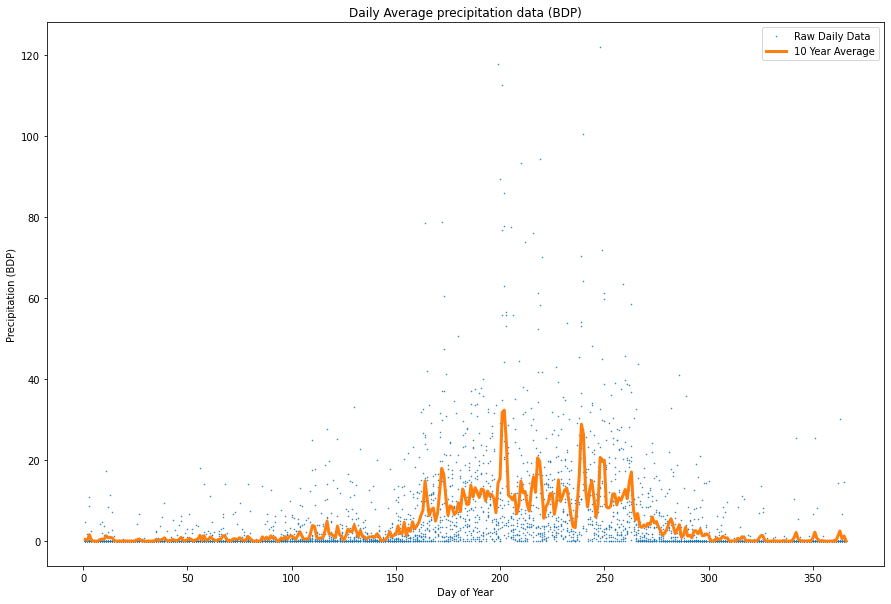

In [20]:
plt.figure(figsize=(15, 10))
plt.plot(new_df.dayofyear, new_df.BDP, '.', markersize=1, label='Raw Daily Data');
plt.plot(df_dayofyear_gb_avg.index, df_dayofyear_gb_avg['BDP'], linewidth=3, label='10 Year Average')

plt.legend()
plt.xlabel('Day of Year')
plt.ylabel('Precipitation (BDP)')
plt.title('Daily Average precipitation data (BDP)');
plt.legend();

With 10-years of data plotted at once, you can quickly see what the mean and variability look like over the course of the year, as well as the impact from the occasional extreme event

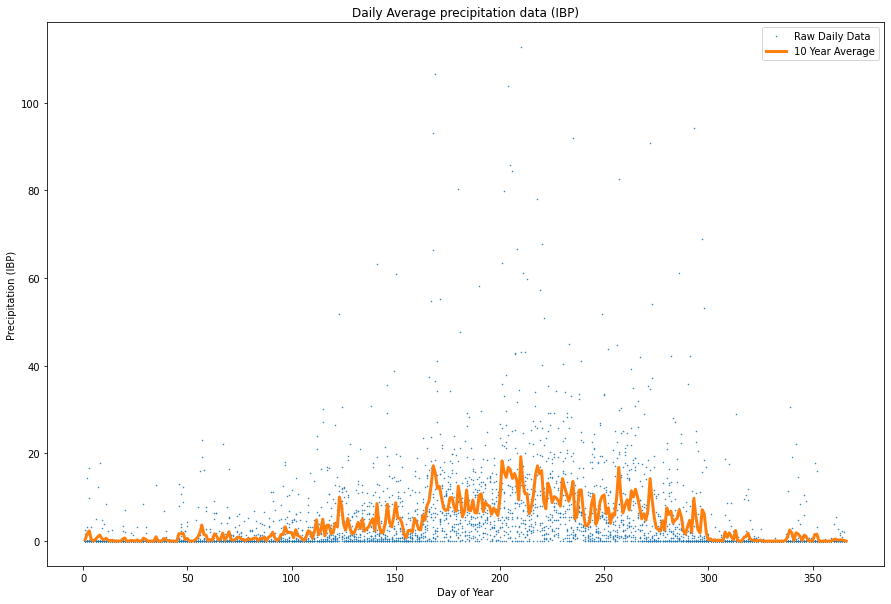

In [21]:
plt.figure(figsize=(15, 10))
plt.plot(new_df.dayofyear, new_df.IBP, '.', markersize=1, label='Raw Daily Data');
plt.plot(df_dayofyear_gb_avg.index, df_dayofyear_gb_avg['IBP'], linewidth=3, label='10 Year Average')

plt.legend()
plt.xlabel('Day of Year')
plt.ylabel('Precipitation (IBP)')
plt.title('Daily Average precipitation data (IBP)');
plt.legend();

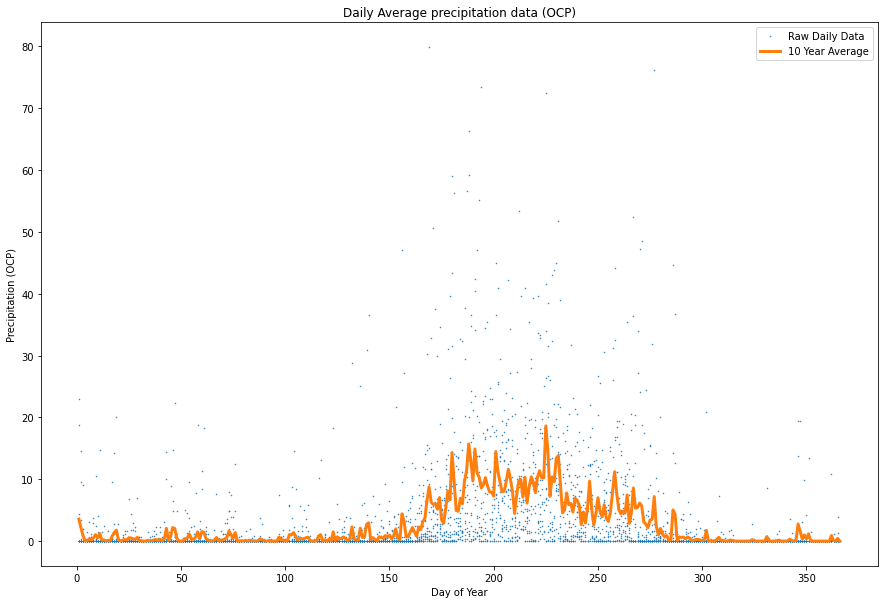

In [22]:
plt.figure(figsize=(15, 10))
plt.plot(new_df.dayofyear, new_df.OCP, '.', markersize=1, label='Raw Daily Data');
plt.plot(df_dayofyear_gb_avg.index, df_dayofyear_gb_avg['OCP'], linewidth=3, label='10 Year Average')

plt.legend()
plt.xlabel('Day of Year')
plt.ylabel('Precipitation (OCP)')
plt.title('Daily Average precipitation data (OCP)');
plt.legend();

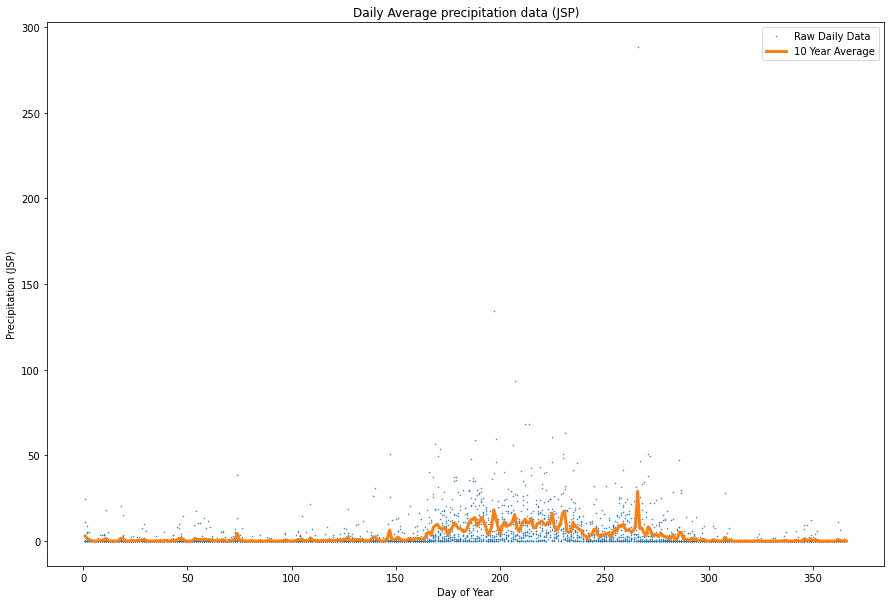

In [35]:
plt.figure(figsize=(15, 10))
plt.plot(new_df.day, new_df.JSP, '.', markersize=1, label='Raw Daily Data');
plt.plot(df_dayofyear_gb_avg.index, df_dayofyear_gb_avg['JSP'], linewidth=3, label='10 Year Average')

plt.legend()
plt.xlabel('Day of Year')
plt.ylabel('Precipitation (JSP)')
plt.title('Daily Average precipitation data (JSP)');
plt.legend();

Now that we have a decade of data, let's calculate a seasonal cycle which we can then use to calculate a daily anomaly measurement.

Now that we have calculated the 10-year average, we can use it to calculate a daily anomaly.

In [49]:
avg_precip_BDP = final_frame.BDP.groupby(final_frame.dayofyear).mean()

In [44]:
final_daily_BDP = final_frame.copy()
final_daily_BDP.set_index('datetime', inplace=True)
final_daily_BDP = final_daily_BDP.resample('1D').mean()

In [47]:
final_daily_BDP

,BDP,IBP,OCP,JSP,year,month,dayofyear,winter,summer,monsoon,post_monsoon,BDP_precip,BDP_precip_anomoly
datetime,,,,,,,,,,,,,
2010-01-01,0.0,0.0,0.0,0.0,2010.0,1.0,1.0,1.0,0.0,0.0,0.0,0.400000,-0.400000
2010-01-02,0.0,0.0,0.0,0.0,2010.0,1.0,2.0,1.0,0.0,0.0,0.0,0.200000,-0.200000
2010-01-03,0.0,0.0,0.0,0.0,2010.0,1.0,3.0,1.0,0.0,0.0,0.0,1.584615,-1.584615
2010-01-04,0.0,0.0,0.0,0.0,2010.0,1.0,4.0,1.0,0.0,0.0,0.0,0.200000,-0.200000
2010-01-05,0.0,0.0,0.0,0.0,2010.0,1.0,5.0,1.0,0.0,0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-21,3.5,9.8,1.0,0.2,2022.0,6.0,172.0,0.0,0.0,1.0,0.0,17.969231,-14.469231
2022-06-22,1.1,1.0,0.0,0.1,2022.0,6.0,173.0,0.0,0.0,1.0,0.0,16.461538,-15.361538
2022-06-23,3.5,0.9,1.5,0.5,2022.0,6.0,174.0,0.0,0.0,1.0,0.0,10.669231,-7.169231


In [48]:
avg_precip_BDP[final_daily_BDP.dayofyear].values

array([ 0.4       ,  0.2       ,  1.58461538, ..., 10.66923077,
        6.35384615,  8.7       ])

In [46]:
final_daily_BDP['BDP_precip'] = avg_precip_BDP[final_daily_BDP.dayofyear].values
final_daily_BDP['BDP_precip_anomoly'] = final_daily_BDP['BDP'] - final_daily_BDP['BDP_precip']

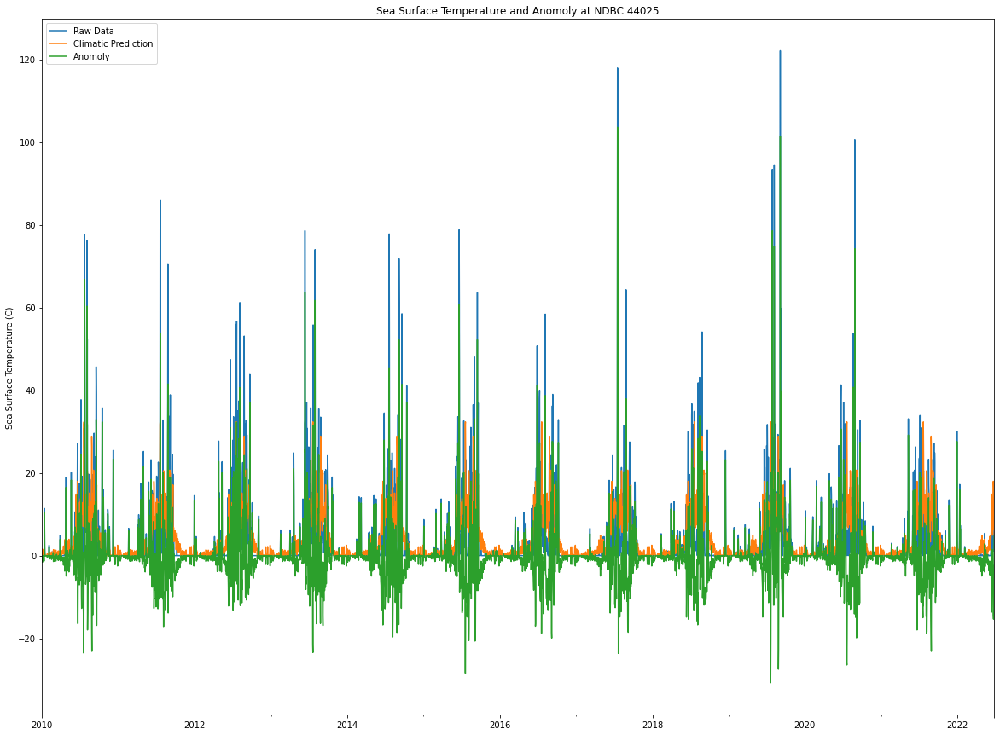

In [53]:
plt.figure(figsize=(20, 15))
final_daily_BDP['BDP'].plot(label='Raw Data')
final_daily_BDP['BDP_precip'].plot(label='Climatic Prediction')
final_daily_BDP['BDP_precip_anomoly'].plot(label='Anomoly')
plt.legend(loc='upper left');
plt.xlabel('')
plt.ylabel('Sea Surface Temperature (C)')
plt.title('Sea Surface Temperature and Anomoly at NDBC 44025')
plt.show()

We will try to fit a distribution to our histogram. The aim of distribution fitting is to predict the probability or to forecast the frequency of occurrence of the magnitude of the phenomenon in a certain interval.

In [55]:
precip_BDP = final_frame['BDP'].values
precip_IBP = final_frame['IBP'].values
precip_OCP = final_frame['OCP'].values
precip_JSP = final_frame['JSP'].values

Fitting 5 distributions: 100%|███████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10.79it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.104274,8713.256498,-48690.321109,inf,0.545075,0.0
expon,0.133365,3310.893696,-47576.938264,inf,0.545076,0.0
chi2,0.190396,1362.147891,-45945.448693,inf,0.545076,0.0
norm,0.255154,5588.687578,-44619.162683,inf,0.336062,0.0
lognorm,0.296634,3361.850991,-43924.001726,inf,0.545007,0.0


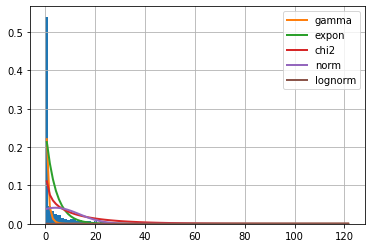

In [56]:
f = Fitter(precip_BDP,
           distributions=['gamma',
                          'lognorm',
                          'norm',
                          'expon',
                          'chi2'])
f.fit()
f.summary()

In [57]:
f.get_best(method = 'sumsquare_error')

{'gamma': {'a': 0.2242877355767836,
  'loc': -8.624313941139153e-28,
  'scale': 1.5622089494833307}}

Fitting 5 distributions: 100%|███████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 10.26it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.098115,8128.628806,-48967.893579,inf,0.498133,0.0
expon,0.124159,3076.367197,-47903.030338,inf,0.498136,0.0
chi2,0.174096,1345.151612,-46353.467143,inf,0.498136,0.0
lognorm,0.193008,1373.279557,-45883.317417,inf,0.498135,0.0
norm,0.243403,5512.677944,-44834.109740,inf,0.323496,0.0


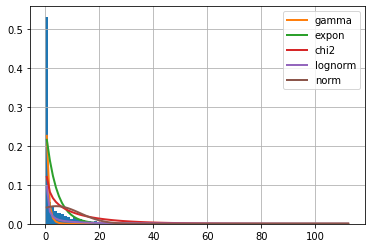

In [58]:
f = Fitter(precip_IBP,
           distributions=['gamma',
                          'lognorm',
                          'norm',
                          'expon',
                          'chi2'])
f.fit()
f.summary()

In [59]:
f.get_best(method = 'sumsquare_error')

{'gamma': {'a': 0.20629223669081814,
  'loc': -6.006060846837117e-28,
  'scale': 1.5622085109694748}}

Fitting 5 distributions: 100%|███████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 11.48it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
expon,0.390736,3262.808692,-42676.280874,inf,0.637640,0.0
gamma,0.412108,1291.128413,-42425.070953,inf,0.637640,0.0
chi2,0.557204,1228.332628,-41049.866334,inf,0.637640,0.0
lognorm,0.648646,1530.232368,-40357.103393,inf,0.637640,0.0
norm,0.713187,4649.146085,-39933.074702,inf,0.352391,0.0


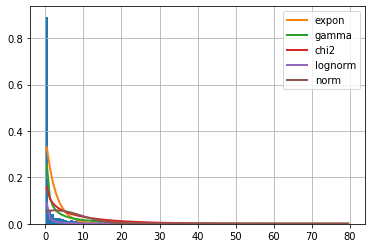

In [60]:
f = Fitter(precip_OCP,
           distributions=['gamma',
                          'lognorm',
                          'norm',
                          'expon',
                          'chi2'])
f.fit()
f.summary()

In [61]:
f.get_best(method = 'sumsquare_error')

{'expon': {'loc': 0.0, 'scale': 2.6048694889230095}}

Fitting 5 distributions: 100%|███████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 11.15it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
expon,0.007042,10401.788967,-60985.737320,inf,0.627550,0.0
chi2,0.037519,2667.659810,-53350.393876,inf,0.627550,0.0
norm,0.054140,38968.502913,-51686.945475,inf,0.367733,0.0
lognorm,0.062976,1629.433263,-50989.275028,inf,0.627550,0.0
gamma,0.070945,20030.834000,-50446.068831,inf,0.511567,0.0


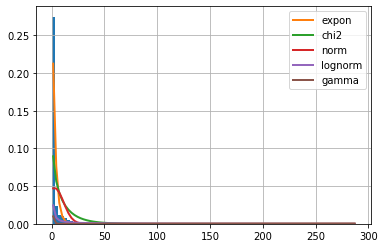

In [62]:
f = Fitter(precip_JSP,
           distributions=['gamma',
                          'lognorm',
                          'norm',
                          'expon',
                          'chi2'])
f.fit()
f.summary()

In [63]:
f.get_best(method = 'sumsquare_error')

{'expon': {'loc': 0.0, 'scale': 2.82930467207721}}

In [64]:
precip_BDP = final_frame['BDP']
parameters = stats.gamma.fit(precip_BDP)
print(parameters)
print(precip_BDP.shape)

(0.2242877355767836, -8.624313941139153e-28, 1.5622089494833307)
(4559,)


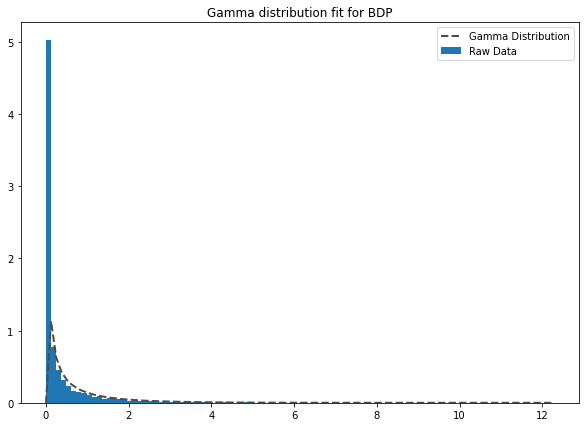

In [65]:
a, loc, scale = 0.2242877355767836, -8.624313941139153e-28, 1.5622089494833307
size = 5000

y = stats.gamma.rvs(a, loc, scale, size=size)
x = np.linspace(0, y.max(), 100)

params_gamma = stats.gamma.fit(y)
pdf_fitted = stats.gamma.pdf(x, *params_gamma)

plt.figure(figsize=(10, 7))
plt.plot(x, pdf_fitted, color='#4B4C4E', linewidth=2, linestyle='--', label='Gamma Distribution')
plt.hist(y, density=True, bins=100, label='Raw Data')
plt.title('Gamma distribution fit for BDP')
plt.legend(loc='upper right')
plt.show()

In [67]:
return_period = final_frame['BDP']
params = stats.gamma.fit(return_period)
pdf_fitted = stats.gamma.ppf([0.8], *params)
print(pdf_fitted)
return_period = final_frame['BDP']
params = stats.gamma.fit(return_period)
pdf_fitted = stats.gamma.ppf([0.9], *params)
print(pdf_fitted)
return_period = final_frame['BDP']
params = stats.gamma.fit(return_period)
pdf_fitted = stats.gamma.ppf([0.95], *params)
print(pdf_fitted)
return_period = final_frame['BDP']
params = stats.gamma.fit(return_period)
pdf_fitted = stats.gamma.ppf([0.99], *params)
print(pdf_fitted)

[0.48765484]
[1.05785879]
[1.75019005]
[3.62233334]


In [53]:
precip_IBP = final_frame['IBP']
parameters = stats.gamma.fit(precip_IBP)
print(parameters)
print(precip_IBP.shape)

(0.20629223669081814, -6.006060846837117e-28, 1.5622085109694748)
(4559,)


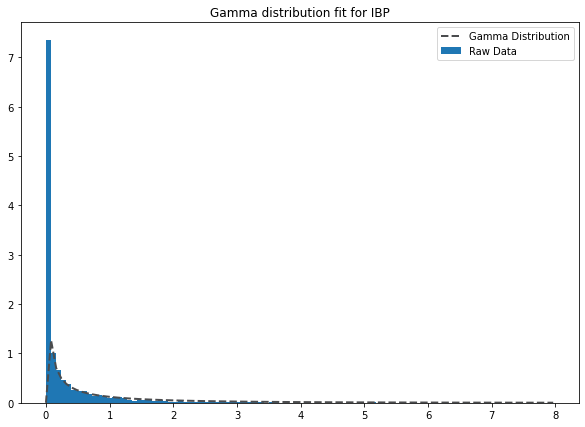

In [52]:
a, loc, scale = 0.20629223669081814, -6.006060846837117e-28, 1.5622085109694748
size = 5000

y = stats.gamma.rvs(a, loc, scale, size=size)
x = np.linspace(0, y.max(), 100)

params_gamma = stats.gamma.fit(y)
pdf_fitted = stats.gamma.pdf(x, *params_gamma)

plt.figure(figsize=(10, 7))
plt.plot(x, pdf_fitted, color='#4B4C4E', linewidth=2, linestyle='--', label='Gamma Distribution')
plt.hist(y, density=True, bins=100, label='Raw Data')
plt.title('Gamma distribution fit for IBP')
plt.legend(loc='upper right')
plt.show()

In [68]:
return_period = final_frame['IBP']
params = stats.gamma.fit(return_period)
pdf_fitted = stats.gamma.ppf([0.8], *params)
print(pdf_fitted)
return_period = final_frame['IBP']
params = stats.gamma.fit(return_period)
pdf_fitted = stats.gamma.ppf([0.9], *params)
print(pdf_fitted)
return_period = final_frame['IBP']
params = stats.gamma.fit(return_period)
pdf_fitted = stats.gamma.ppf([0.95], *params)
print(pdf_fitted)
return_period = final_frame['IBP']
params = stats.gamma.fit(return_period)
pdf_fitted = stats.gamma.ppf([0.99], *params)
print(pdf_fitted)

[0.43144097]
[0.97471158]
[1.64705252]
[3.48883534]


In [55]:
precip_OCP = final_frame['OCP']
parameters = stats.expon.fit(precip_OCP)
print(parameters)
print(precip_OCP.shape)

(0.0, 2.6048694889230095)
(4559,)


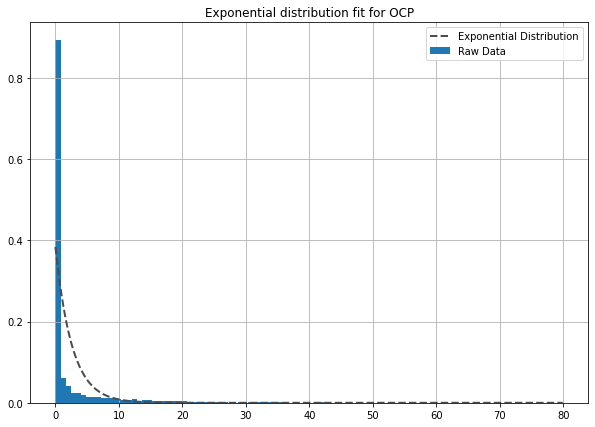

In [59]:
x = np.linspace(np.min(precip_OCP), np.max(precip_OCP), 4559)

expondist = stats.expon.pdf(x, *parameters)

plt.figure(figsize=(10, 7))
plt.plot(x, expondist, color='#4B4C4E', linewidth=2, linestyle='--', label='Exponential Distribution')
precip_OCP.hist(density=True, bins=100, label='Raw Data')
plt.title('Exponential distribution fit for OCP')
plt.legend(loc='upper right')
plt.show()

In [69]:
return_period = final_frame['OCP']
params = stats.expon.fit(return_period)
pdf_fitted = stats.expon.ppf([0.8], *params)
print(pdf_fitted)
return_period = final_frame['OCP']
params = stats.expon.fit(return_period)
pdf_fitted = stats.expon.ppf([0.9], *params)
print(pdf_fitted)
return_period = final_frame['OCP']
params = stats.expon.fit(return_period)
pdf_fitted = stats.expon.ppf([0.95], *params)
print(pdf_fitted)
return_period = final_frame['OCP']
params = stats.expon.fit(return_period)
pdf_fitted = stats.expon.ppf([0.99], *params)
print(pdf_fitted)

[4.19237571]
[5.99793365]
[7.8034916]
[11.99586731]


In [61]:
precip_JSP = final_frame['JSP']
parameters = stats.expon.fit(precip_JSP)
print(parameters)
print(precip_JSP.shape)

(0.0, 2.82930467207721)
(4559,)


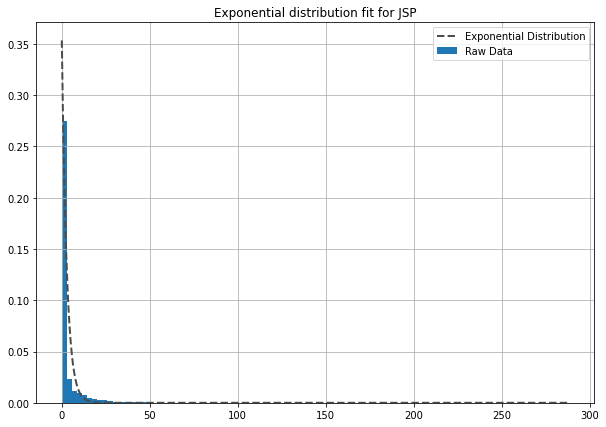

In [62]:
x = np.linspace(np.min(precip_JSP), np.max(precip_JSP), 5000)

expondist = stats.expon.pdf(x, *parameters)

plt.figure(figsize=(10, 7))
plt.plot(x, expondist, color='#4B4C4E', linewidth=2, linestyle='--', label='Exponential Distribution')
precip_JSP.hist(density=True, bins=100, label='Raw Data')
plt.title('Exponential distribution fit for JSP')
plt.legend(loc='upper right')
plt.show()

In [70]:
return_period = final_frame['JSP']
params = stats.expon.fit(return_period)
pdf_fitted = stats.expon.ppf([0.8], *params)
print(pdf_fitted)
return_period = final_frame['JSP']
params = stats.expon.fit(return_period)
pdf_fitted = stats.expon.ppf([0.9], *params)
print(pdf_fitted)
return_period = final_frame['JSP']
params = stats.expon.fit(return_period)
pdf_fitted = stats.expon.ppf([0.95], *params)
print(pdf_fitted)
return_period = final_frame['JSP']
params = stats.expon.fit(return_period)
pdf_fitted = stats.expon.ppf([0.99], *params)
print(pdf_fitted)

[4.55359021]
[6.51471476]
[8.47583932]
[13.02942952]


In [70]:
final_frame['fDM'] = final_frame['datetime'] + pd.offsets.MonthEnd(-1) + pd.offsets.Day(1)

In [71]:
precip_fDM = final_frame[['datetime', 'BDP', 'IBP', 'OCP', 'JSP', 'year', 'month', 'day', 'fDM']]
precip_fDM = final_frame.set_index('fDM')
precip_fDM = precip_fDM.reset_index()

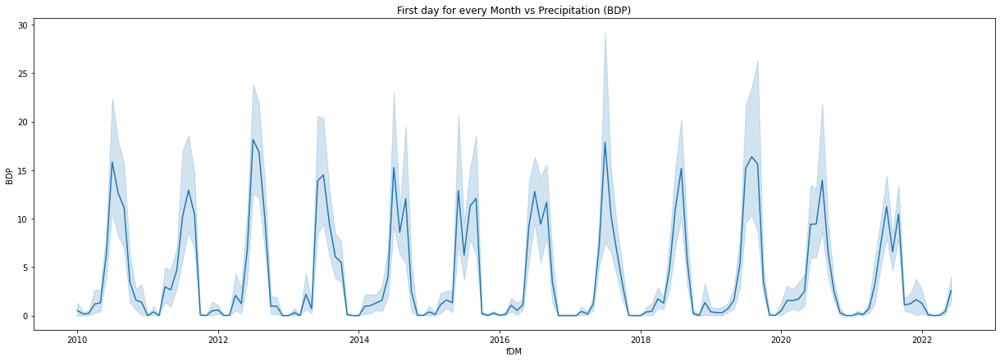

In [77]:
plt.figure(figsize=(21, 7))
sns.lineplot(data=precip_fDM, x='fDM', y='BDP')
plt.title('First day for every Month vs Precipitation (BDP)')
plt.show()

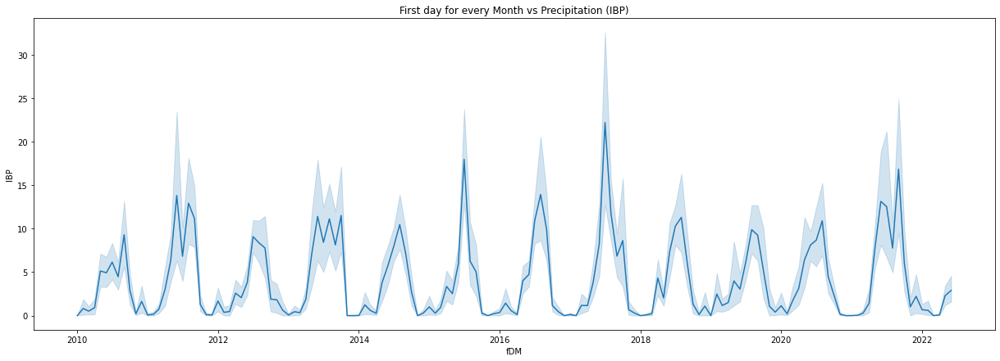

In [76]:
plt.figure(figsize=(21, 7))
sns.lineplot(data=precip_fDM, x='fDM', y='IBP')
plt.title('First day for every Month vs Precipitation (IBP)')
plt.show()

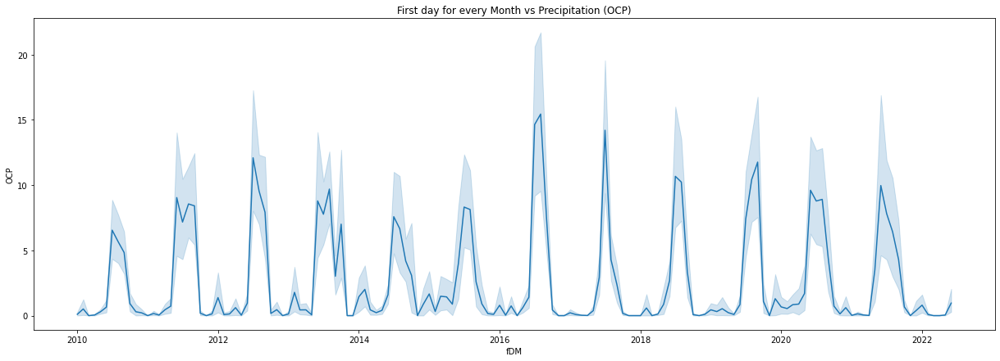

In [78]:
plt.figure(figsize=(21, 7))
sns.lineplot(data=precip_fDM, x='fDM', y='OCP')
plt.title('First day for every Month vs Precipitation (OCP)')
plt.show()

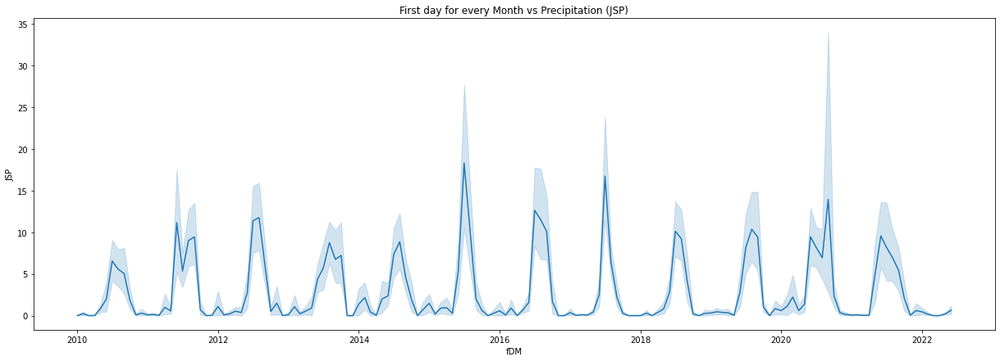

In [79]:
plt.figure(figsize=(21, 7))
sns.lineplot(data=precip_fDM, x='fDM', y='JSP')
plt.title('First day for every Month vs Precipitation (JSP)')
plt.show()

In [84]:
frame_BDP = final_frame[final_frame['BDP']>0]

shape, loc, scale = stats.genextreme.fit(frame_BDP['BDP'])

return_periods = np.array([5, 10, 15, 20])
return_levels = stats.genextreme.isf(1/return_periods, shape, loc, scale)

for period, level in zip(return_periods, return_levels):
    print(f'{period:4.0f}  {level:9.2f}')

   5      12.64
  10      28.38
  15      44.49
  20      60.85


In [85]:
frame_BDP = final_frame[final_frame['IBP']>0]

shape, loc, scale = stats.genextreme.fit(frame_BDP['IBP'])

return_periods = np.array([5, 10, 15, 20])
return_levels = stats.genextreme.isf(1/return_periods, shape, loc, scale)

for period, level in zip(return_periods, return_levels):
    print(f'{period:4.0f}  {level:9.2f}')

   5      11.28
  10      21.61
  15      30.86
  20      39.49


In [86]:
frame_BDP = final_frame[final_frame['OCP']>0]

shape, loc, scale = stats.genextreme.fit(frame_BDP['OCP'])

return_periods = np.array([5, 10, 15, 20])
return_levels = stats.genextreme.isf(1/return_periods, shape, loc, scale)

for period, level in zip(return_periods, return_levels):
    print(f'{period:4.0f}  {level:9.2f}')

   5      10.24
  10      23.90
  15      38.36
  20      53.36


In [87]:
frame_BDP = final_frame[final_frame['JSP']>0]

shape, loc, scale = stats.genextreme.fit(frame_BDP['JSP'])

return_periods = np.array([5, 10, 15, 20])
return_levels = stats.genextreme.isf(1/return_periods, shape, loc, scale)

for period, level in zip(return_periods, return_levels):
    print(f'{period:4.0f}  {level:9.2f}')

   5      10.84
  10      25.55
  15      41.23
  20      57.56


In [88]:
def calc_max_precip_year(df, col_name):
    max_index =  df[col_name].idxmax(skipna=True)
    max_year = df.iloc[max_index]['year']
    return max_year

print(calc_max_precip_year(final_frame, 'BDP'))
print(calc_max_precip_year(final_frame, 'IBP'))
print(calc_max_precip_year(final_frame, 'OCP'))
print(calc_max_precip_year(final_frame, 'JSP'))

2019
2021
2021
2020


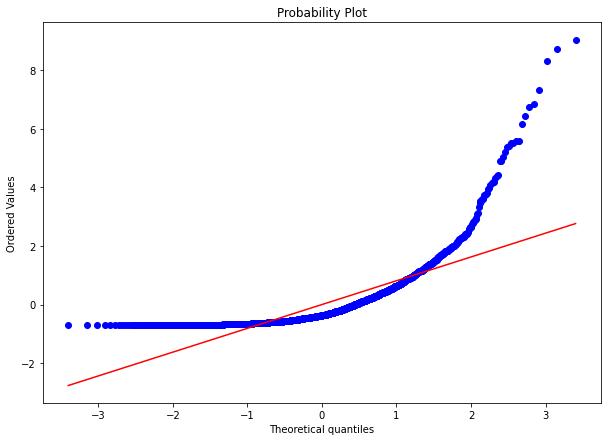

In [91]:
frame_BDP = final_frame[final_frame['BDP']>0]
z  = (frame_BDP['BDP']-np.mean(frame_BDP['BDP']))/np.std(frame_BDP['BDP'])
plt.figure(figsize=(10, 7))
stats.probplot(z, plot=plt)
plt.show()

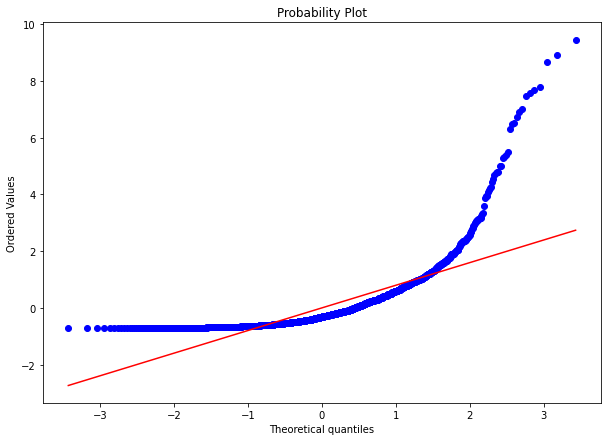

In [92]:
frame_IBP = final_frame[final_frame['IBP']>0]
z  = (frame_IBP['IBP']-np.mean(frame_IBP['IBP']))/np.std(frame_IBP['IBP'])
plt.figure(figsize=(10, 7))
stats.probplot(z, plot=plt)
plt.show()

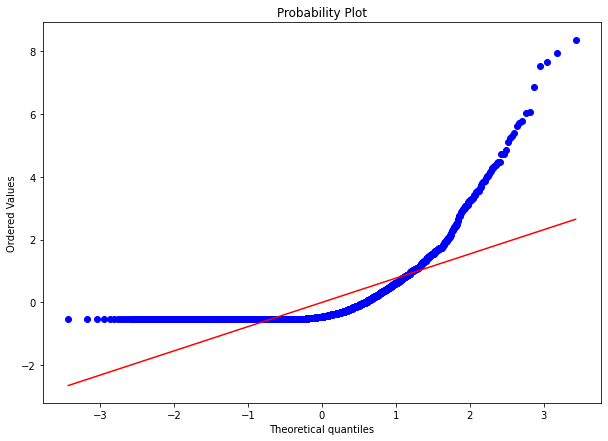

In [93]:
frame_OCP = final_frame[final_frame['IBP']>0]
z  = (frame_OCP['OCP']-np.mean(frame_OCP['OCP']))/np.std(frame_OCP['OCP'])
plt.figure(figsize=(10, 7))
stats.probplot(z, plot=plt)
plt.show()

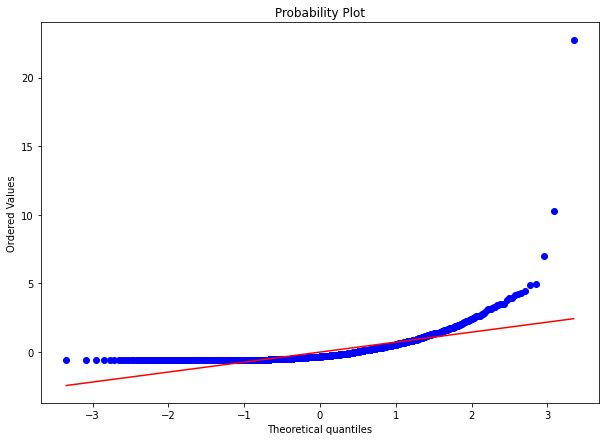

In [95]:
frame_JSP = final_frame[final_frame['JSP']>0]
z  = (frame_JSP['JSP']-np.mean(frame_JSP['JSP']))/np.std(frame_JSP['JSP'])
plt.figure(figsize=(10, 7))
stats.probplot(z, plot=plt)
plt.show()

In [96]:
final_frame.loc[(final_frame['year']==2010)&(final_frame['IBP']>0), :]

,datetime,BDP,IBP,OCP,JSP,year,month,day,winter,summer,monsoon,post_monsoon,fDM
45,2010-02-15,0.4,0.5,0.0,0.0,2010,2,46,1,0,0,0,2010-02-01
46,2010-02-16,0.0,4.0,0.6,1.2,2010,2,47,1,0,0,0,2010-02-01
47,2010-02-17,0.1,12.4,0.0,0.0,2010,2,48,1,0,0,0,2010-02-01
53,2010-02-23,0.3,4.9,0.0,0.0,2010,2,54,1,0,0,0,2010-02-01
54,2010-02-24,1.1,0.6,0.0,0.0,2010,2,55,1,0,0,0,2010-02-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...
340,2010-12-07,10.4,1.1,0.3,0.3,2010,12,341,1,0,0,0,2010-12-01
341,2010-12-08,25.5,22.1,3.6,6.1,2010,12,342,1,0,0,0,2010-12-01
342,2010-12-09,5.4,14.6,1.3,2.1,2010,12,343,1,0,0,0,2010-12-01
343,2010-12-10,0.6,8.5,0.0,0.0,2010,12,344,1,0,0,0,2010-12-01


In [97]:
final_frame.groupby(['year', 'monsoon'])[['JSP', 'BDP', 'OCP', 'IBP']].agg([np.sum, np.mean])

JSP               BDP                OCP               IBP  \
                 sum      mean     sum       mean     sum      mean     sum   
year monsoon                                                                  
2010 0         100.7  0.414403   301.5   1.240741    71.2  0.293004   371.3   
     1         585.7  4.800820  1406.8  11.531148   542.8  4.449180   756.0   
2011 0          77.9  0.320576   198.7   0.817695    50.9  0.209465   360.9   
     1        1062.3  8.707377  1170.8   9.596721  1011.0  8.286885  1362.3   
2012 0         130.3  0.534016   179.8   0.736885    86.6  0.354918   351.5   
     1         978.5  8.020492  1583.9  12.982787   937.1  7.681148   888.4   
2013 0         308.2  1.268313   269.7   1.109877   299.3  1.231687   657.0   
     1         783.4  6.421311  1342.6  11.004918   895.4  7.339344  1192.3   
2014 0         262.9  1.081893   223.3   0.918930   256.4  1.055144   271.6   
     1         709.3  5.813934  1220.0  10.000000   614.7  5.038525   959.0   
2015 0         143.4  0.590123   154.9   0.637449   211.6  0.870782   260.9   
     1        1103.9  9.048361  1292.0  10.590164   706.3  5.789344  1081.0   
2016 0         120.7  0.494672   194.9   0.798770    80.9  0.331557   246.7   
     1        1099.1  9.009016  1315.1  10.779508  1195.7  9.800820  1208.5   
2017 0          38.6  0.158848   150.2   0.618107    26.6  0.109465   491.7   
     1         857.3  7.027049  1284.5  10.528689   731.4  5.995082  1504.5   
2018 0          59.2  0.243621   164.9   0.678601    51.6  0.212346   278.8   
     1         803.5  6.586066  1125.5   9.225410   829.4  6.798361  1068.6   
2019 0         103.3  0.425103   211.1   0.868724   121.8  0.501235   478.8   
     1         938.4  7.691803  1607.5  13.176230   930.9  7.630328   865.3   
2020 0         265.5  1.088115   324.7   1.330738   185.9  0.761885   465.4   
     1        1170.1  9.590984  1201.3   9.846721   969.1  7.943443   984.5   
2021 0         238.3  0.980658   251.8   1.036214   146.9  0.604527   575.5   
     1         917.8  7.522951  1087.9   8.917213   869.8  7.129508  1529.1   
2022 0          24.5  0.162252    55.5   0.367550    28.4  0.188079   111.4   
     1          16.0  0.640000    64.5   2.580000    23.9  0.956000    72.4   

                         
                   mean  
year monsoon             
2010 0         1.527984  
     1         6.196721  
2011 0         1.485185  
     1        11.166393  
2012 0         1.440574  
     1         7.281967  
2013 0         2.703704  
     1         9.772951  
2014 0         1.117695  
     1         7.860656  
2015 0         1.073663  
     1         8.860656  
2016 0         1.011066  
     1         9.905738  
2017 0         2.023457  
     1        12.331967  
2018 0         1.147325  
     1         8.759016  
2019 0         1.970370  
     1         7.092623  
2020 0         1.907377  
     1         8.069672  
2021 0         2.368313  
     1        12.533607  
2022 0         0.737748  
     1         2.896000

In [98]:
cond_2 = final_frame["BDP"].shift(-3).rolling(3, min_periods=1).sum() >= 20
final_frame[cond_2].iloc[0]["datetime"]

Timestamp('2010-04-23 00:00:00')

In [100]:
final_frame['BDP'].shift(-3).rolling(3).sum()

0        NaN
1        NaN
2        0.0
3        0.0
4        0.0
        ... 
4554    10.9
4555    23.4
4556     NaN
4557     NaN
4558     NaN
Name: BDP, Length: 4559, dtype: float64

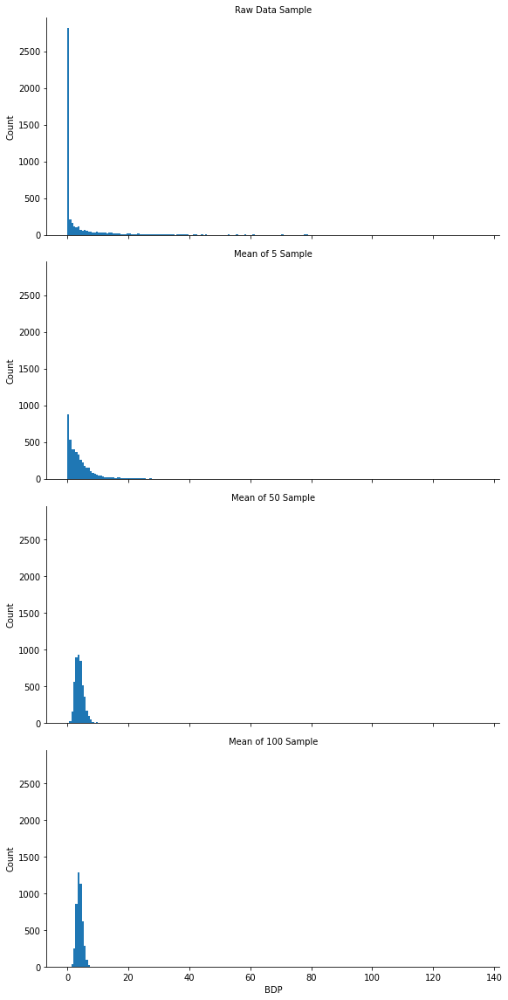

In [106]:
sample_data = pd.DataFrame({
    'BDP': final_frame['BDP'].sample(4559),
    'type': 'Raw Data Sample'
})
sample_data_5 = pd.DataFrame({
    'BDP': [final_frame['BDP'].sample(5).mean() for _ in range(4559)],
    'type': 'Mean of 5 Sample'
})
sample_data_50 = pd.DataFrame({
    'BDP': [final_frame['BDP'].sample(50).mean() for _ in range(4559)],
    'type': 'Mean of 50 Sample'
})
sample_data_100 = pd.DataFrame({
    'BDP': [final_frame['BDP'].sample(100).mean() for _ in range(4559)],
    'type': 'Mean of 100 Sample'
})

results = pd.concat([sample_data, sample_data_5, sample_data_50, sample_data_100])

g = sns.FacetGrid(results, col='type', col_wrap=1, height=4, aspect=2)
g.map(plt.hist, 'BDP', range=[0, 135], bins=200)
g.set_axis_labels('BDP', 'Count')
g.set_titles('{col_name}')
plt.show()

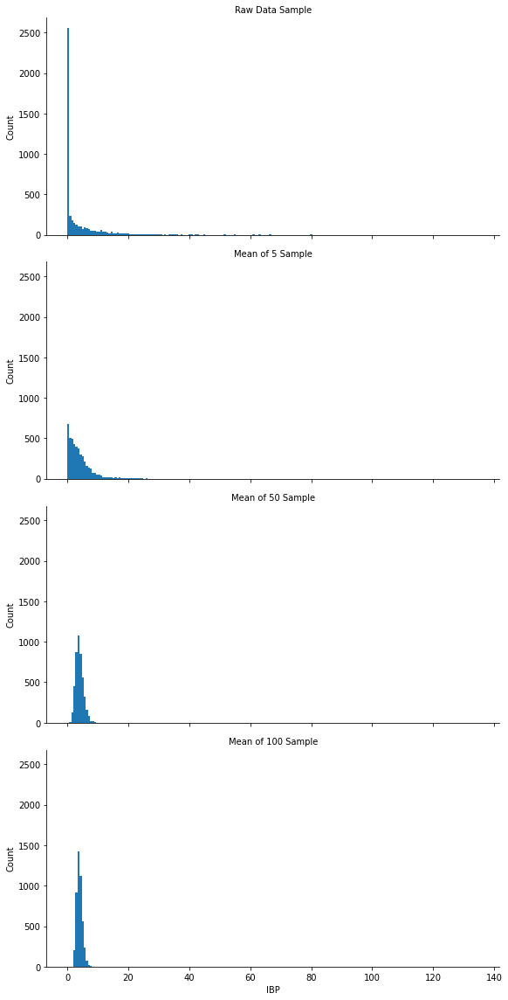

In [108]:
sample_data = pd.DataFrame({
    'IBP': final_frame['IBP'].sample(4559),
    'type': 'Raw Data Sample'
})
sample_data_5 = pd.DataFrame({
    'IBP': [final_frame['IBP'].sample(5).mean() for _ in range(4559)],
    'type': 'Mean of 5 Sample'
})
sample_data_50 = pd.DataFrame({
    'IBP': [final_frame['IBP'].sample(50).mean() for _ in range(4559)],
    'type': 'Mean of 50 Sample'
})
sample_data_100 = pd.DataFrame({
    'IBP': [final_frame['IBP'].sample(100).mean() for _ in range(4559)],
    'type': 'Mean of 100 Sample'
})

results = pd.concat([sample_data, sample_data_5, sample_data_50, sample_data_100])

g = sns.FacetGrid(results, col='type', col_wrap=1, height=4, aspect=2)
g.map(plt.hist, 'IBP', range=[0, 135], bins=200)
g.set_axis_labels('IBP', 'Count')
g.set_titles('{col_name}')
plt.show()

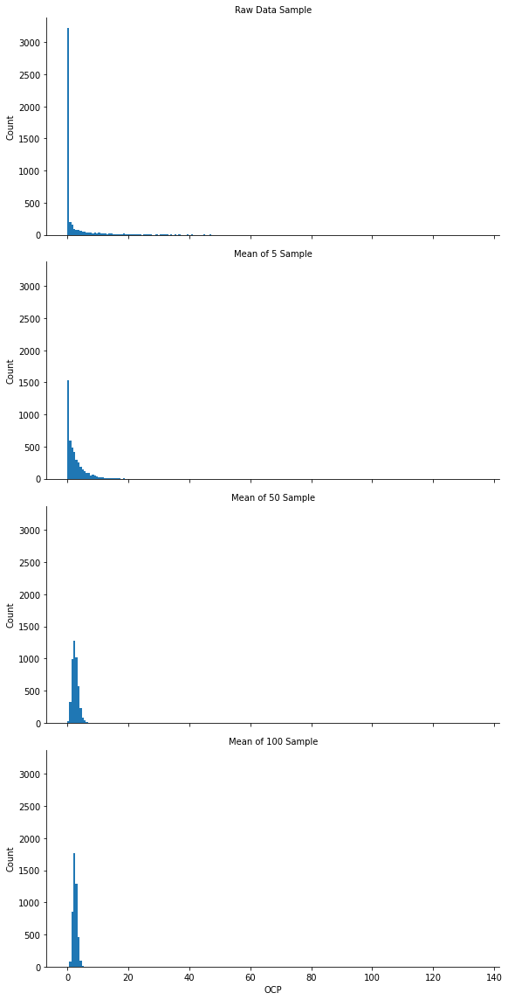

In [109]:
sample_data = pd.DataFrame({
    'OCP': final_frame['OCP'].sample(4559),
    'type': 'Raw Data Sample'
})
sample_data_5 = pd.DataFrame({
    'OCP': [final_frame['OCP'].sample(5).mean() for _ in range(4559)],
    'type': 'Mean of 5 Sample'
})
sample_data_50 = pd.DataFrame({
    'OCP': [final_frame['OCP'].sample(50).mean() for _ in range(4559)],
    'type': 'Mean of 50 Sample'
})
sample_data_100 = pd.DataFrame({
    'OCP': [final_frame['OCP'].sample(100).mean() for _ in range(4559)],
    'type': 'Mean of 100 Sample'
})

results = pd.concat([sample_data, sample_data_5, sample_data_50, sample_data_100])

g = sns.FacetGrid(results, col='type', col_wrap=1, height=4, aspect=2)
g.map(plt.hist, 'OCP', range=[0, 135], bins=200)
g.set_axis_labels('OCP', 'Count')
g.set_titles('{col_name}')
plt.show()

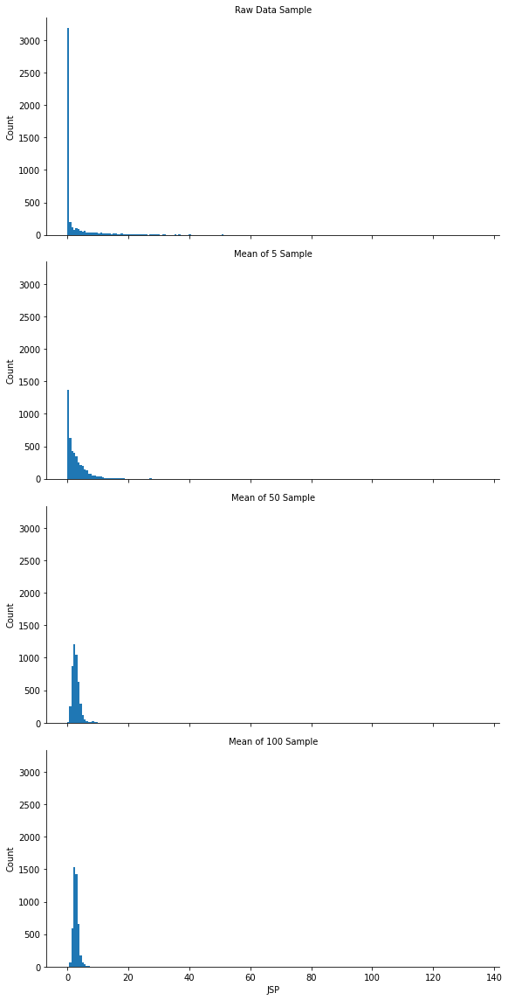

In [110]:
sample_data = pd.DataFrame({
    'JSP': final_frame['JSP'].sample(4559),
    'type': 'Raw Data Sample'
})
sample_data_5 = pd.DataFrame({
    'JSP': [final_frame['JSP'].sample(5).mean() for _ in range(4559)],
    'type': 'Mean of 5 Sample'
})
sample_data_50 = pd.DataFrame({
    'JSP': [final_frame['JSP'].sample(50).mean() for _ in range(4559)],
    'type': 'Mean of 50 Sample'
})
sample_data_100 = pd.DataFrame({
    'JSP': [final_frame['JSP'].sample(100).mean() for _ in range(4559)],
    'type': 'Mean of 100 Sample'
})

results = pd.concat([sample_data, sample_data_5, sample_data_50, sample_data_100])

g = sns.FacetGrid(results, col='type', col_wrap=1, height=4, aspect=2)
g.map(plt.hist, 'JSP', range=[0, 135], bins=200)
g.set_axis_labels('JSP', 'Count')
g.set_titles('{col_name}')
plt.show()

In [113]:
print(stats.trim_mean(final_frame['BDP'], 0.1))
print(np.average(final_frame['BDP'], weights=final_frame['year']))
print(wquantiles.median(final_frame['BDP'], weights=final_frame['year']))

1.731104412167717
4.0317053018506375
0.0


In [114]:
print(stats.trim_mean(final_frame['IBP'], 0.1))
print(np.average(final_frame['IBP'], weights=final_frame['year']))
print(wquantiles.median(final_frame['IBP'], weights=final_frame['year']))

2.038695533022746
4.034637571397015
0.1


In [115]:
print(stats.trim_mean(final_frame['OCP'], 0.1))
print(np.average(final_frame['OCP'], weights=final_frame['year']))
print(wquantiles.median(final_frame['OCP'], weights=final_frame['year']))

0.8532200602904907
2.604795148104259
0.0


In [116]:
print(stats.trim_mean(final_frame['JSP'], 0.1))
print(np.average(final_frame['JSP'], weights=final_frame['year']))
print(wquantiles.median(final_frame['JSP'], weights=final_frame['year']))

0.9474650589202521
2.8293046319782453
0.0


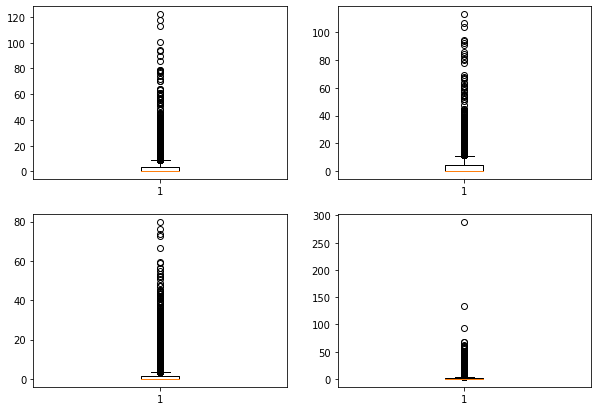

In [123]:
fig, ax = plt.subplots(2, 2, figsize=(10, 7))
ax[0][0].boxplot(final_frame['BDP'])
ax[0][1].boxplot(final_frame['IBP'])
ax[1][0].boxplot(final_frame['OCP'])
ax[1][1].boxplot(final_frame['JSP'])
plt.show()

In [130]:
r = final_frame[final_frame['BDP']>0]
r = r['BDP']
results = []
for nrepeat in range(1000):
    sample = resample(r)
    results.append(sample.median())
results = pd.Series(results)
print('Bootstrap Statistics:')
print(f'original: {r.median()}')
print(f'bias: {results.mean() - r.median()}')
print(f'std. error: {results.std()}')

Bootstrap Statistics:
original: 4.2
bias: 0.0196499999999995
std. error: 0.2000284701958421


In [131]:
r = final_frame[final_frame['IBP']>0]
r = r['IBP']
results = []
for nrepeat in range(1000):
    sample = resample(r)
    results.append(sample.median())
results = pd.Series(results)
print('Bootstrap Statistics:')
print(f'original: {r.median()}')
print(f'bias: {results.mean() - r.median()}')
print(f'std. error: {results.std()}')

Bootstrap Statistics:
original: 4.5
bias: 0.025350000000000428
std. error: 0.18464552924853467


In [132]:
r = final_frame[final_frame['OCP']>0]
r = r['OCP']
results = []
for nrepeat in range(1000):
    sample = resample(r)
    results.append(sample.median())
results = pd.Series(results)
print('Bootstrap Statistics:')
print(f'original: {r.median()}')
print(f'bias: {results.mean() - r.median()}')
print(f'std. error: {results.std()}')

Bootstrap Statistics:
original: 3.4
bias: -0.012649999999999828
std. error: 0.1970439133893859


In [133]:
r = final_frame[final_frame['JSP']>0]
r = r['JSP']
results = []
for nrepeat in range(1000):
    sample = resample(r)
    results.append(sample.median())
results = pd.Series(results)
print('Bootstrap Statistics:')
print(f'original: {r.median()}')
print(f'bias: {results.mean() - r.median()}')
print(f'std. error: {results.std()}')

Bootstrap Statistics:
original: 3.6
bias: -0.009899999999999576
std. error: 0.15572810035841717


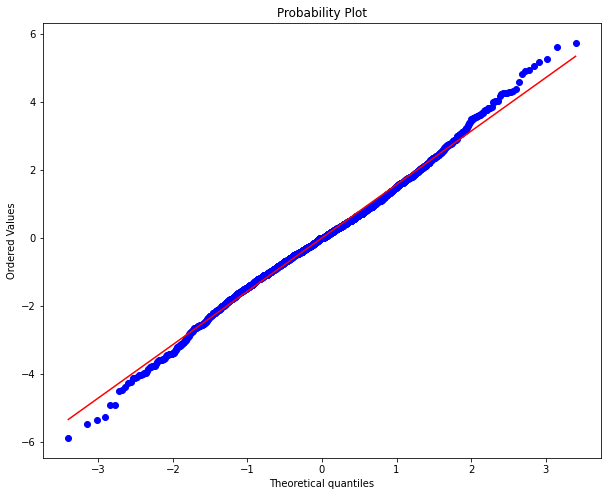

In [144]:
r_BDP = final_frame.BDP
r_BDP = np.diff(np.log(r_BDP[r_BDP>0]))
fig, ax = plt.subplots(figsize=(10, 8))
stats.probplot(r_BDP, plot=ax)
plt.show()

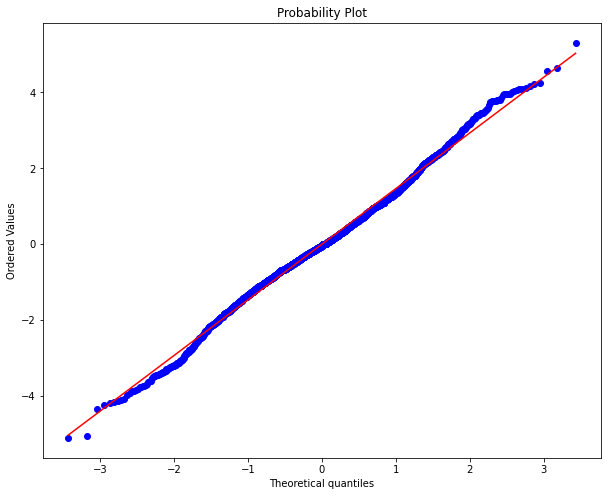

In [145]:
r_IBP = final_frame.IBP
r_IBP = np.diff(np.log(r_IBP[r_IBP>0]))
fig, ax = plt.subplots(figsize=(10, 8))
stats.probplot(r_IBP, plot=ax)
plt.show()

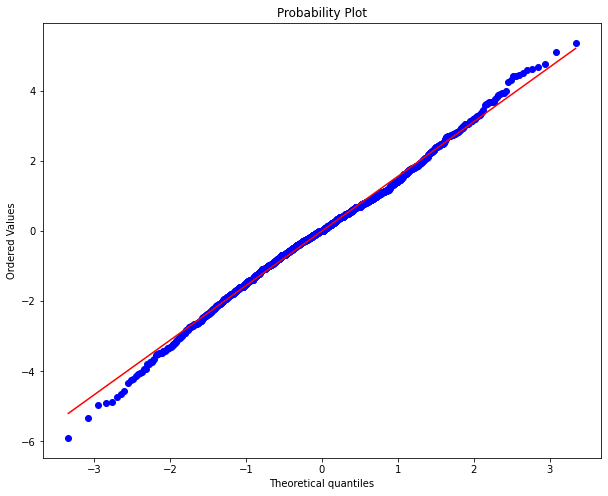

In [146]:
r_OCP = final_frame.OCP
r_OCP = np.diff(np.log(r_OCP[r_OCP>0]))
fig, ax = plt.subplots(figsize=(10, 8))
stats.probplot(r_OCP, plot=ax)
plt.show()

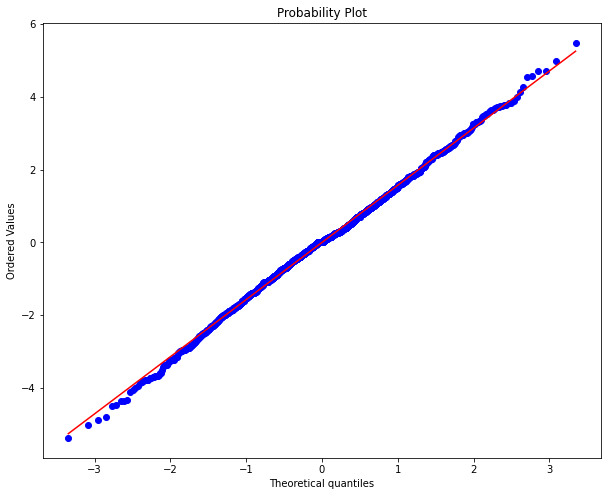

In [147]:
r_JSP = final_frame.JSP
r_JSP = np.diff(np.log(r_JSP[r_JSP>0]))
fig, ax = plt.subplots(figsize=(10, 8))
stats.probplot(r_JSP, plot=ax)
plt.show()

In [149]:
print(final_frame['winter'].value_counts())
print(final_frame['summer'].value_counts())
print(final_frame['monsoon'].value_counts())
print(final_frame['post_monsoon'].value_counts())

0    3417
1    1142
Name: winter, dtype: int64
0    3363
1    1196
Name: summer, dtype: int64
0    3070
1    1489
Name: monsoon, dtype: int64
0    3827
1     732
Name: post_monsoon, dtype: int64


In [16]:
px.histogram(x=final_frame['year'], y=final_frame['BDP'], color=final_frame['winter'], nbins=100)

In [17]:
px.histogram(x=final_frame['year'], y=final_frame['IBP'], color=final_frame['winter'], nbins=100)

In [18]:
px.histogram(x=final_frame['year'], y=final_frame['OCP'], color=final_frame['winter'], nbins=100)

In [19]:
px.histogram(x=final_frame['year'], y=final_frame['JSP'], color=final_frame['winter'], nbins=100)

In [20]:
px.histogram(x=final_frame['year'], y=final_frame['BDP'], color=final_frame['summer'], nbins=100)

In [21]:
px.histogram(x=final_frame['year'], y=final_frame['IBP'], color=final_frame['summer'], nbins=100)

In [22]:
px.histogram(x=final_frame['year'], y=final_frame['OCP'], color=final_frame['summer'], nbins=100)

In [23]:
px.histogram(x=final_frame['year'], y=final_frame['JSP'], color=final_frame['summer'], nbins=100)

In [24]:
px.histogram(x=final_frame['year'], y=final_frame['OCP'], color=final_frame['monsoon'], nbins=100)

In [25]:
px.histogram(x=final_frame['year'], y=final_frame['OCP'], color=final_frame['monsoon'], nbins=100)

In [26]:
px.histogram(x=final_frame['year'], y=final_frame['OCP'], color=final_frame['monsoon'], nbins=100)

In [27]:
px.histogram(x=final_frame['year'], y=final_frame['OCP'], color=final_frame['monsoon'], nbins=100)

In [28]:
px.histogram(x=final_frame['year'], y=final_frame['BDP'], color=final_frame['post_monsoon'], nbins=100)

In [29]:
px.histogram(x=final_frame['year'], y=final_frame['IBP'], color=final_frame['post_monsoon'], nbins=100)

In [30]:
px.histogram(x=final_frame['year'], y=final_frame['OCP'], color=final_frame['post_monsoon'], nbins=100)

In [31]:
px.histogram(x=final_frame['year'], y=final_frame['JSP'], color=final_frame['post_monsoon'], nbins=100)

In [32]:
plot_ = final_frame[final_frame['BDP']>0].groupby('datetime').agg(BDP=('BDP', np.mean),
                                                                  IBP=('IBP', np.mean),
                                                                  OCP=('OCP', np.mean),
                                                                  JSP=('JSP', np.mean),
                                    winter=('winter', 'unique'),
                                    summer=('summer', 'unique'),
                                    monsoon=('monsoon', 'unique'),
                                    post_monsoon=('post_monsoon', 'unique'),
                                    year=('year', 'unique')
)
r1 = [plot_.sample(5).mean() for _ in range(2074)]
r2 = [plot_.sample(10).mean() for _ in range(2074)]
r3 = [plot_.sample(20).mean() for _ in range(2074)]
pd.DataFrame(r1)

,BDP,IBP,OCP,JSP,winter,summer,monsoon,post_monsoon,year
0,16.38,3.10,0.98,0.82,0.0,0.8,0.2,0.0,2014.6
1,6.50,1.44,2.64,3.06,0.0,0.4,0.6,0.0,2012.4
2,5.98,6.34,1.46,2.70,0.0,0.4,0.4,0.2,2014.4
3,11.40,6.56,1.88,3.48,0.2,0.2,0.6,0.0,2015.4
4,6.78,5.20,17.20,7.84,0.0,0.4,0.6,0.0,2015.4
...,...,...,...,...,...,...,...,...,...
2069,3.58,3.74,0.40,1.64,0.0,0.4,0.4,0.2,2013.0
2070,7.50,6.70,6.56,3.44,0.0,0.2,0.6,0.2,2015.2
2071,18.26,9.64,6.72,8.62,0.0,0.0,0.8,0.2,2014.6
2072,13.94,6.58,7.22,5.30,0.2,0.4,0.4,0.0,2014.2


<AxesSubplot:ylabel='Frequency'>

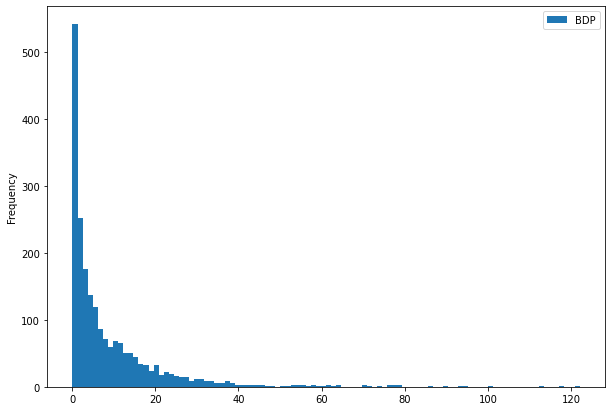

In [33]:
plot_.plot(kind='hist', x='winter', y='BDP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

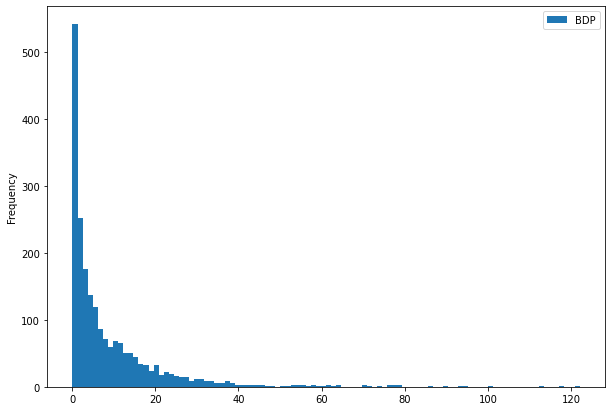

In [188]:
plot_.plot(kind='hist', x='summer', y='BDP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

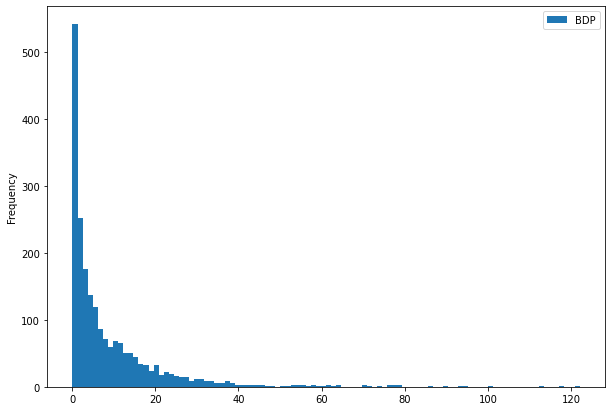

In [189]:
plot_.plot(kind='hist', x='monsoon', y='BDP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

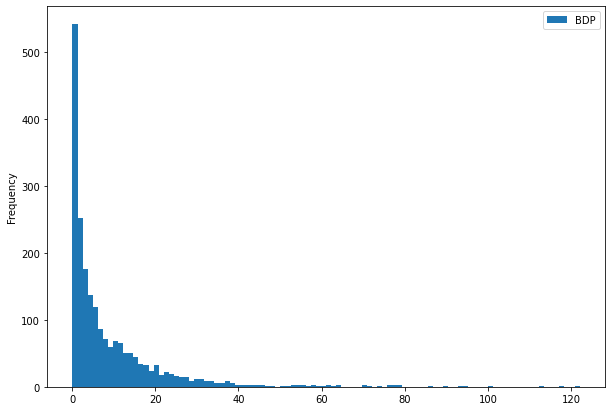

In [190]:
plot_.plot(kind='hist', x='post_monsoon', y='BDP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

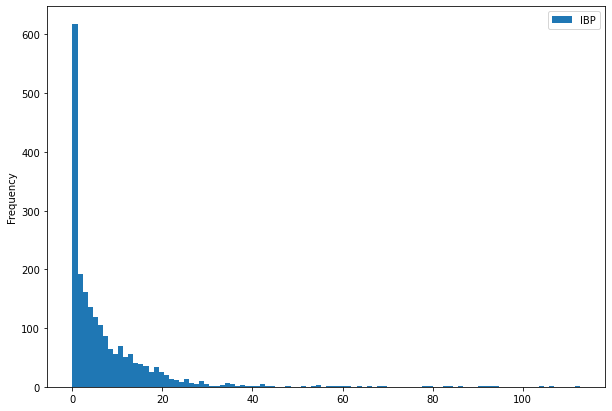

In [191]:
plot_.plot(kind='hist', x='winter', y='IBP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

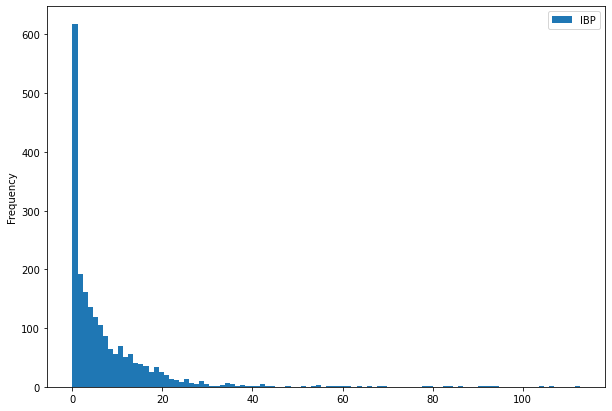

In [192]:
plot_.plot(kind='hist', x='summer', y='IBP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

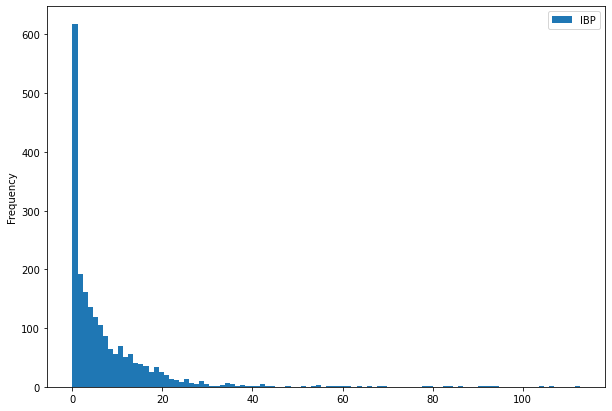

In [193]:
plot_.plot(kind='hist', x='monsoon', y='IBP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

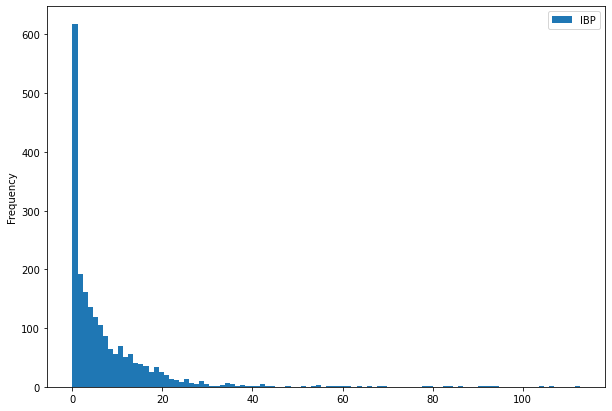

In [194]:
plot_.plot(kind='hist', x='post_monsoon', y='IBP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

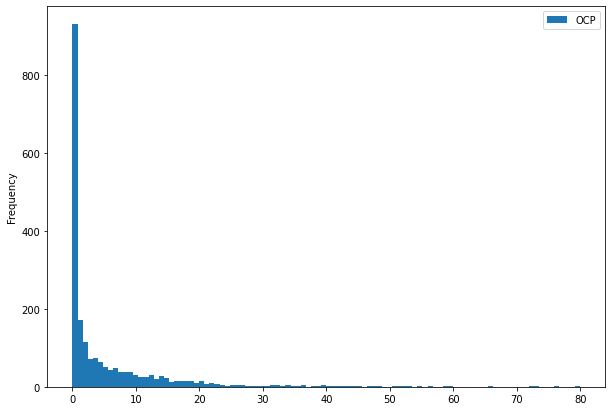

In [195]:
plot_.plot(kind='hist', x='winter', y='OCP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

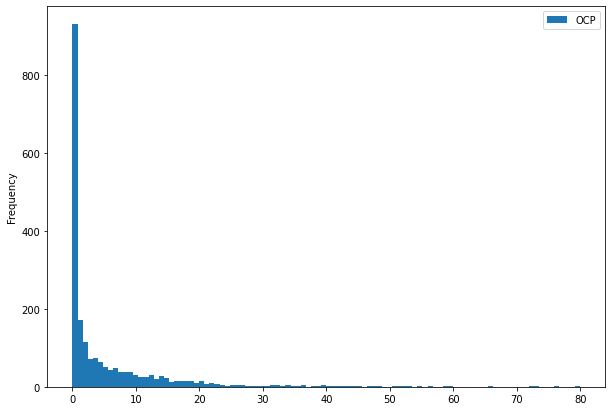

In [196]:
plot_.plot(kind='hist', x='summer', y='OCP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

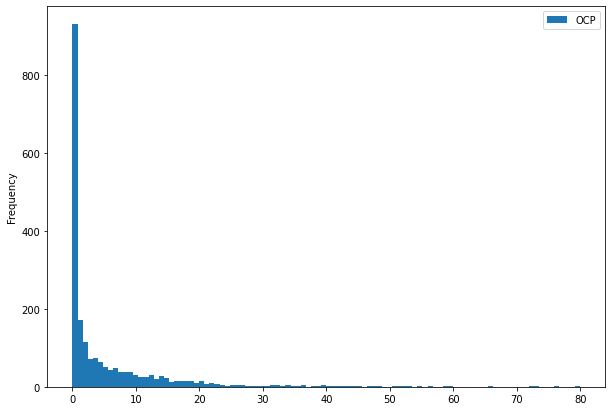

In [197]:
plot_.plot(kind='hist', x='monsoon', y='OCP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

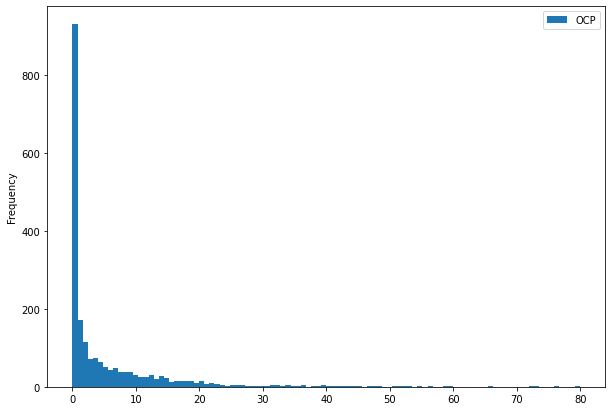

In [198]:
plot_.plot(kind='hist', x='post_monsoon', y='OCP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

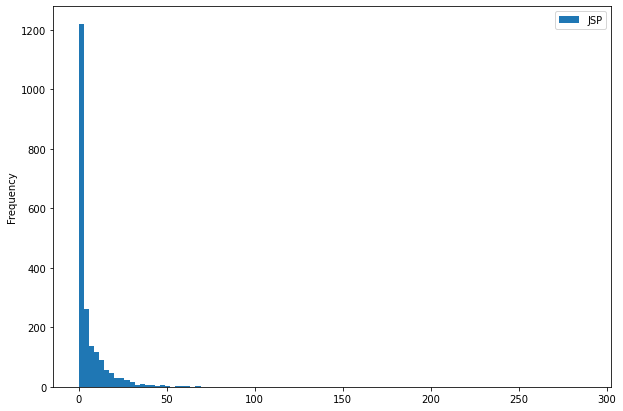

In [199]:
plot_.plot(kind='hist', x='winter', y='JSP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

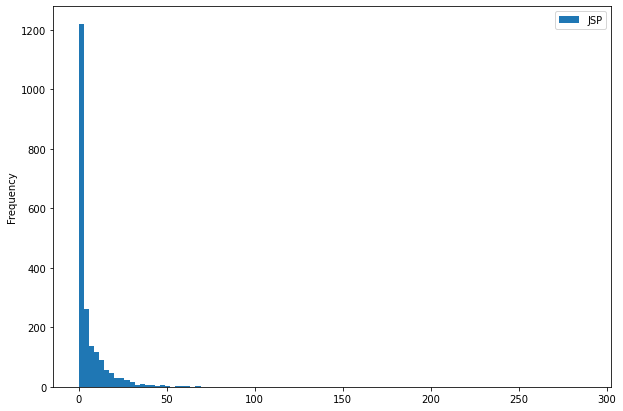

In [200]:
plot_.plot(kind='hist', x='summer', y='JSP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

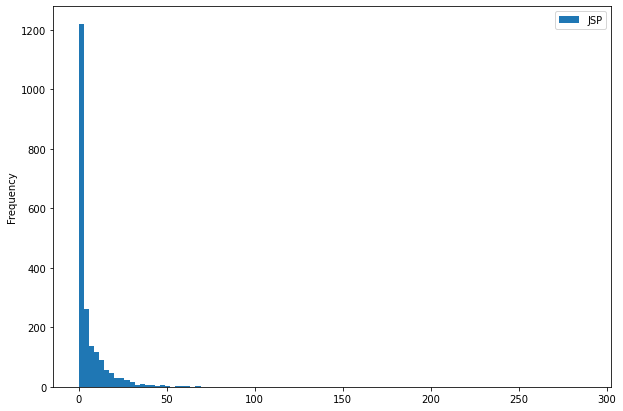

In [201]:
plot_.plot(kind='hist', x='monsoon', y='JSP', bins=100, figsize=(10, 7))

<AxesSubplot:ylabel='Frequency'>

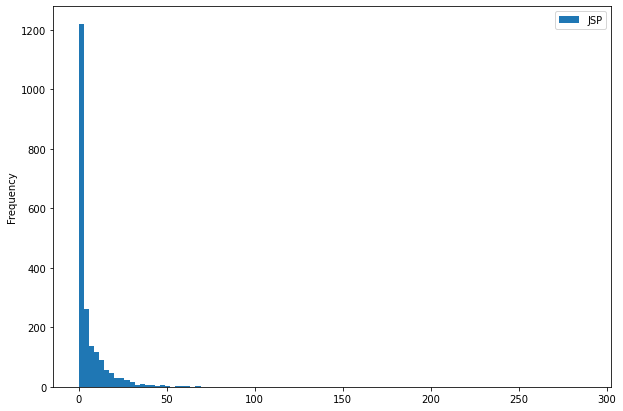

In [202]:
plot_.plot(kind='hist', x='post_monsoon', y='JSP', bins=100, figsize=(10, 7))

<AxesSubplot:xlabel='winter,summer,monsoon,post_monsoon'>

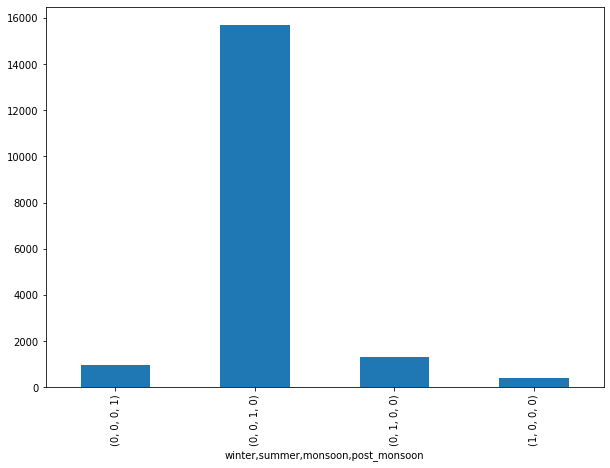

In [203]:
final_frame.groupby(['winter', 'summer', 'monsoon', 'post_monsoon'])['BDP'].sum().plot(kind='bar', figsize=(10, 7))

In [204]:
winter_BDP = final_frame[final_frame['BDP']>0].query("winter==1")
summer_BDP = final_frame[final_frame['BDP']>0].query("summer==1")
monsoon_BDP = final_frame[final_frame['BDP']>0].query("monsoon==1")
post_monsoon_BDP = final_frame[final_frame['BDP']>0].query("post_monsoon==1")

In [205]:
winter_BDP_precip_ = winter_BDP.groupby('year')['BDP'].agg([np.sum, np.mean])
winter_BDP_precip_ = winter_BDP_precip_.reset_index()
summer_BDP_precip_ = summer_BDP.groupby('year')['BDP'].agg([np.sum, np.mean])
summer_BDP_precip_ = summer_BDP_precip_.reset_index()
monsoon_BDP_precip_ = monsoon_BDP.groupby('year')['BDP'].agg([np.sum, np.mean])
monsoon_BDP_precip_ = monsoon_BDP_precip_.reset_index()
post_monsoon_BDP_precip_ = post_monsoon_BDP.groupby('year')['BDP'].agg([np.sum, np.mean])
post_monsoon_BDP_precip_ = post_monsoon_BDP_precip_.reset_index()

<AxesSubplot:xlabel='year'>

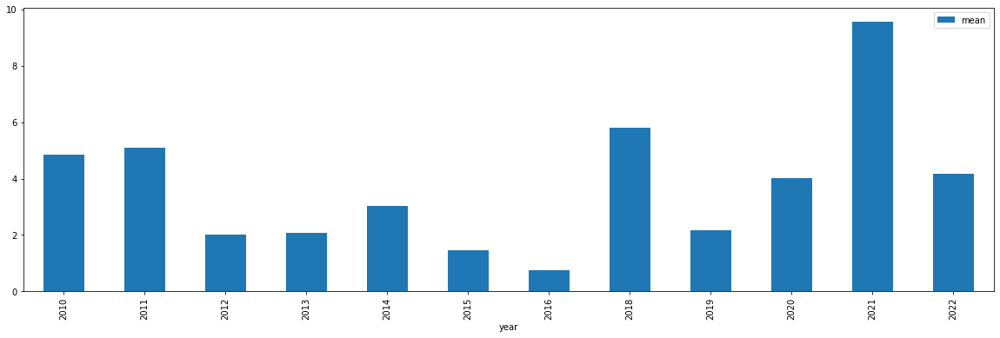

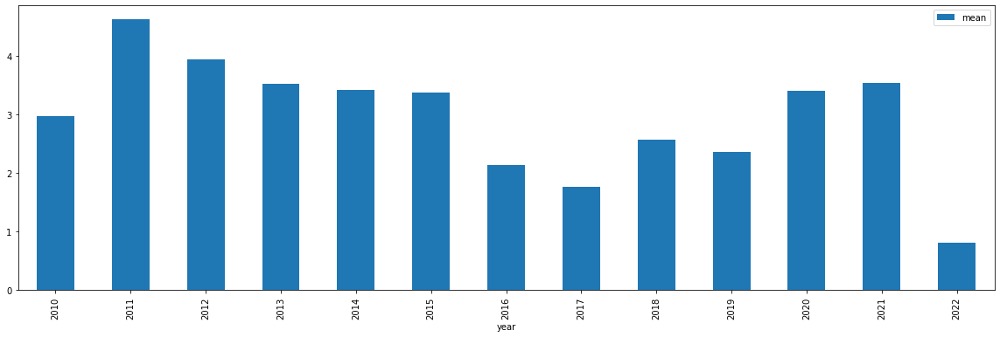

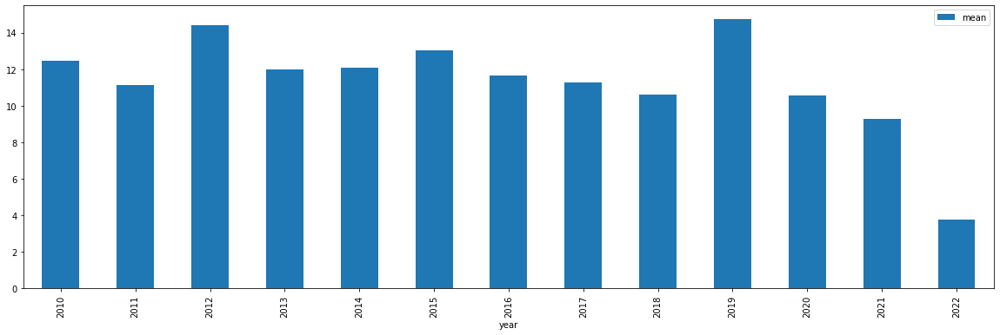

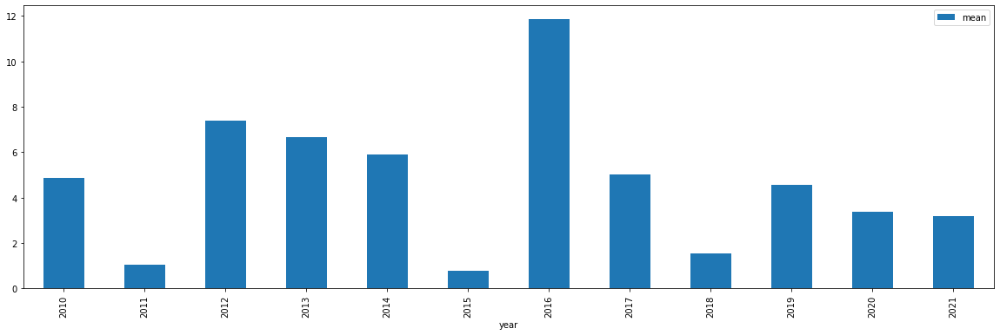

In [206]:
winter_BDP_precip_.plot(kind='bar', x='year', y='mean', figsize=(20, 6))
summer_BDP_precip_.plot(kind='bar', x='year', y='mean', figsize=(20, 6))
monsoon_BDP_precip_.plot(kind='bar', x='year', y='mean', figsize=(20, 6))
post_monsoon_BDP_precip_.plot(kind='bar', x='year', y='mean', figsize=(20, 6))

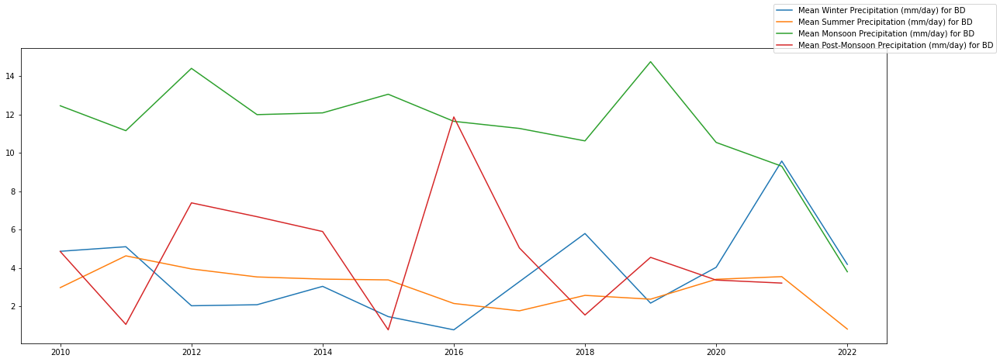

In [207]:
fig, ax = plt.subplots(1, 1, figsize=(20, 7))
ax.plot(winter_BDP_precip_['year'], winter_BDP_precip_['mean'], label='Mean Winter Precipitation (mm/day) for BD')
ax.plot(summer_BDP_precip_['year'], summer_BDP_precip_['mean'], label='Mean Summer Precipitation (mm/day) for BD')
ax.plot(monsoon_BDP_precip_['year'], monsoon_BDP_precip_['mean'], label='Mean Monsoon Precipitation (mm/day) for BD')
ax.plot(post_monsoon_BDP_precip_['year'], post_monsoon_BDP_precip_['mean'], label='Mean Post-Monsoon Precipitation (mm/day) for BD')
fig.legend()
plt.show()

<AxesSubplot:xlabel='year', ylabel='mean'>

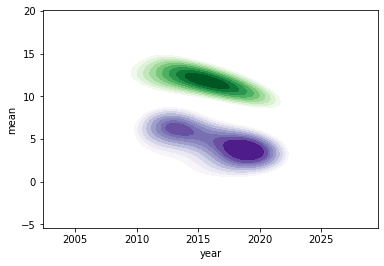

In [208]:
sns.kdeplot(data=monsoon_BDP_precip_, 
            x='year', y='mean', alpha=1,
            shade=True, cmap='Greens', thresh=0.5)
sns.kdeplot(data=post_monsoon_BDP_precip_, 
            x='year', y='mean', cmap='Purples',
            shade=True, alpha=1, thresh=0.5)

<AxesSubplot:xlabel='year', ylabel='mean'>

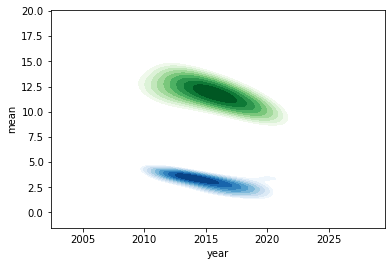

In [209]:
sns.kdeplot(data=monsoon_BDP_precip_, 
            x='year', y='mean', alpha=1,
            shade=True, cmap='Greens', thresh=0.5)
sns.kdeplot(data=summer_BDP_precip_, 
            x='year', y='mean', alpha=1,
            shade=True, cmap='Blues', thresh=0.5)

<AxesSubplot:xlabel='year', ylabel='mean'>

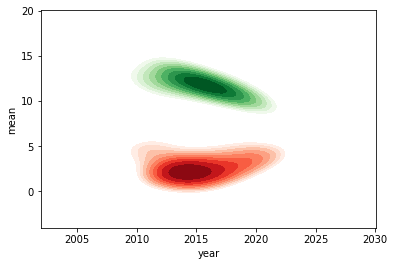

In [210]:
sns.kdeplot(data=monsoon_BDP_precip_, 
            x='year', y='mean', alpha=1,
            shade=True, cmap='Greens', thresh=0.5)
sns.kdeplot(data=winter_BDP_precip_, 
            x='year', y='mean', alpha=1,
            shade=True, cmap='Reds', thresh=0.5)

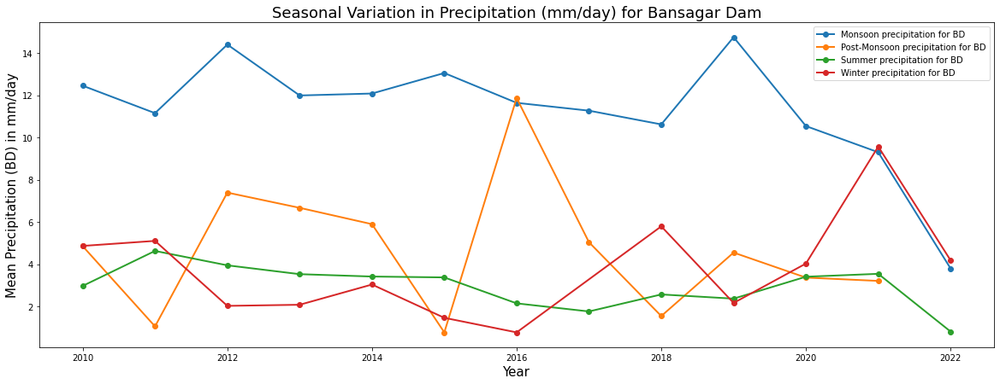

In [211]:
plt.figure(figsize=(20, 7))
plt.plot(monsoon_BDP_precip_['year'], monsoon_BDP_precip_['mean'], marker='o', linewidth=2, label='Monsoon precipitation for BD')
plt.plot(post_monsoon_BDP_precip_['year'], post_monsoon_BDP_precip_['mean'], marker='o', linewidth=2, label='Post-Monsoon precipitation for BD')
plt.plot(summer_BDP_precip_['year'], summer_BDP_precip_['mean'], marker='o', linewidth=2, label='Summer precipitation for BD')
plt.plot(winter_BDP_precip_['year'], winter_BDP_precip_['mean'], marker='o', linewidth=2, label='Winter precipitation for BD')
plt.xlabel('Year', fontsize=15)
plt.ylabel('Mean Precipitation (BD) in mm/day', fontsize=15)
plt.title('Seasonal Variation in Precipitation (mm/day) for Bansagar Dam', fontsize=18)
plt.legend()
plt.show()

In [212]:
monthly_BDP_ = final_frame.groupby(['year', 'month'])['BDP'].mean()

In [213]:
monthly_BDP_ = monthly_BDP_.reset_index()
monthly_BDP_

,year,month,BDP
0,2010,1,0.525806
1,2010,2,0.157143
2,2010,3,0.212903
3,2010,4,1.186667
4,2010,5,1.319355
...,...,...,...
145,2022,2,0.096429
146,2022,3,0.000000
147,2022,4,0.030000
148,2022,5,0.412903


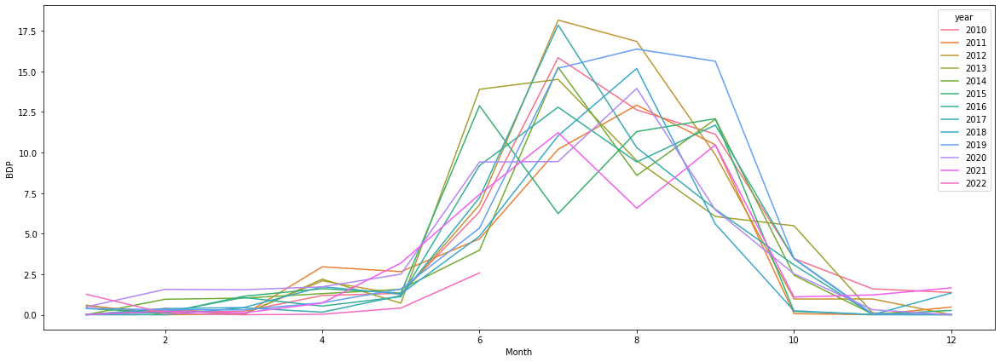

In [214]:
years = monthly_BDP_.year.unique()
colors = sns.color_palette('husl', n_colors=len(years)) 
cmap = dict(zip(years, colors))

plt.figure(figsize=(20, 7))
sns.lineplot(x=monthly_BDP_.month, y=monthly_BDP_.BDP, hue=monthly_BDP_.year, palette=cmap)
plt.xlabel('Mean Precipitation (mm/day) for BD')
plt.xlabel('Month')
plt.show()

Counting Number of days and calculating the Probability for number of days in a particular year having rainfall less than (0.254mm, 1 mm, 2.54 mm, 25.4 mm) .

In [98]:
final_frame[final_frame['BDP']<0.254].query('year==2010')

,datetime,BDP,IBP,OCP,JSP,year,month,dayofyear,winter,summer,monsoon,post_monsoon,value
0,2010-01-01,0.0,0.0,0.0,0.0,2010,1,1,1,0,0,0,0
1,2010-01-02,0.0,0.0,0.0,0.0,2010,1,2,1,0,0,0,0
2,2010-01-03,0.0,0.0,0.0,0.0,2010,1,3,1,0,0,0,0
3,2010-01-04,0.0,0.0,0.0,0.0,2010,1,4,1,0,0,0,0
4,2010-01-05,0.0,0.0,0.0,0.0,2010,1,5,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2010-12-27,0.0,0.0,0.0,0.0,2010,12,361,1,0,0,0,0
361,2010-12-28,0.0,0.0,0.0,0.0,2010,12,362,1,0,0,0,0
362,2010-12-29,0.0,0.0,0.0,0.0,2010,12,363,1,0,0,0,0
363,2010-12-30,0.0,0.0,0.0,0.0,2010,12,364,1,0,0,0,0


In [103]:
print(final_frame[final_frame['BDP']<0.254].query('year==2010')['BDP'].count()/365)
print(final_frame[final_frame['BDP']<1].query('year==2010')['BDP'].count()/365)
print(final_frame[final_frame['BDP']<2.54].query('year==2010')['BDP'].count()/365)
print(final_frame[final_frame['BDP']<25.4].query('year==2010')['BDP'].count()/365)

0.5150684931506849
0.5835616438356165
0.673972602739726
0.958904109589041


In [76]:
final_frame.loc[(final_frame['BDP']<0.254)&(final_frame['year']==2010), ['datetime']].count()/365

datetime    0.515068
dtype: float64

In [77]:
final_frame.loc[(final_frame['BDP']<0.254)&(final_frame['year']==2020), ['datetime']].count()/365

datetime    0.468493
dtype: float64

In [91]:
final_frame_copy = final_frame.copy()
final_frame_copy = final_frame_copy.set_index('datetime')
final_frame_copy['value'] = 0
for i in range(final_frame_copy['BDP'].count()):
    if final_frame_copy['BDP'][i] > 30:
        if final_frame_copy['BDP'][i+1] < 2 and final_frame_copy['BDP'][i+2] < 2 and final_frame_copy['BDP'][i+3] < 2:
            final_frame_copy['value'][i] = 1
            print(f"Sequence of days were found at: {str(final_frame_copy['BDP'].index[i])}")
            print(f"Ppt for day 1: {str(final_frame_copy['BDP'][i])}")
            print(f"Ppt for day 2: {str(final_frame_copy['BDP'][i+1])}")
            print(f"Ppt for day 3: {str(final_frame_copy['BDP'][i+2])}")
            print(f"Ppt for day 4: {str(final_frame_copy['BDP'][i+3])}")

Sequence of days were found at: 2010-10-16 00:00:00
Ppt for day 1: 35.8
Ppt for day 2: 0.1
Ppt for day 3: 0.2
Ppt for day 4: 0.1


C:\Users\lenovo\AppData\Local\Temp\ipykernel_13516\3775290248.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [86]:
final_frame[final_frame['value']>0]

,datetime,BDP,IBP,OCP,JSP,year,month,dayofyear,winter,summer,monsoon,post_monsoon,value
288,2010-10-16,35.8,6.9,8.0,13.9,2010,10,289,0,0,0,1,1


In [90]:
final_frame.iloc[288:, ]

,datetime,BDP,IBP,OCP,JSP,year,month,dayofyear,winter,summer,monsoon,post_monsoon,value
288,2010-10-16,35.8,6.9,8.0,13.9,2010,10,289,0,0,0,1,1
289,2010-10-17,0.1,1.2,3.5,4.7,2010,10,290,0,0,0,1,0
290,2010-10-18,0.2,0.1,3.4,0.5,2010,10,291,0,0,0,1,0
291,2010-10-19,0.1,0.0,1.1,0.0,2010,10,292,0,0,0,1,0
292,2010-10-20,0.2,0.7,6.4,3.3,2010,10,293,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4554,2022-06-21,3.5,9.8,1.0,0.2,2022,6,172,0,0,1,0,0
4555,2022-06-22,1.1,1.0,0.0,0.1,2022,6,173,0,0,1,0,0
4556,2022-06-23,3.5,0.9,1.5,0.5,2022,6,174,0,0,1,0,0
4557,2022-06-24,6.3,4.1,2.9,1.8,2022,6,175,0,0,1,0,0


In [95]:
final_frame_copy = final_frame.copy()
final_frame_copy = final_frame_copy.set_index('datetime')
final_frame_copy['value'] = 0
for i in range(final_frame_copy['BDP'].count()-1):
    if final_frame_copy['BDP'][i] > 10:
        if final_frame_copy['BDP'][i+1] < 2 and final_frame_copy['BDP'][i+2] < 2 and final_frame_copy['BDP'][i+3] < 2:
            final_frame_copy['value'][i] = 1
            print(f"Sequence of days were found at: {str(final_frame_copy['BDP'].index[i])}")
            print(f"Ppt for day 1: {str(final_frame_copy['BDP'][i])}")
            print(f"Ppt for day 2: {str(final_frame_copy['BDP'][i+1])}")
            print(f"Ppt for day 3: {str(final_frame_copy['BDP'][i+2])}")
            print(f"Ppt for day 4: {str(final_frame_copy['BDP'][i+3])}")

C:\Users\lenovo\AppData\Local\Temp\ipykernel_13516\711841863.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Sequence of days were found at: 2010-10-16 00:00:00
Ppt for day 1: 35.8
Ppt for day 2: 0.1
Ppt for day 3: 0.2
Ppt for day 4: 0.1
Sequence of days were found at: 2010-11-13 00:00:00
Ppt for day 1: 10.5
Ppt for day 2: 0.0
Ppt for day 3: 0.0
Ppt for day 4: 0.0
Sequence of days were found at: 2011-05-02 00:00:00
Ppt for day 1: 25.2
Ppt for day 2: 0.7
Ppt for day 3: 0.0
Ppt for day 4: 0.0
Sequence of days were found at: 2011-05-31 00:00:00
Ppt for day 1: 13.5
Ppt for day 2: 0.0
Ppt for day 3: 0.0
Ppt for day 4: 0.0
Sequence of days were found at: 2012-04-29 00:00:00
Ppt for day 1: 15.2
Ppt for day 2: 1.6
Ppt for day 3: 0.0
Ppt for day 4: 0.0
Sequence of days were found at: 2012-05-12 00:00:00
Ppt for day 1: 22.7
Ppt for day 2: 0.4
Ppt for day 3: 0.4
Ppt for day 4: 0.0
Sequence of days were found at: 2013-04-21 00:00:00
Ppt for day 1: 17.9
Ppt for day 2: 0.4
Ppt for day 3: 0.4
Ppt for day 4: 0.1
Sequence of days were found at: 2013-06-15 00:00:00
Ppt for day 1: 11.5
Ppt for day 2: 0.0
Ppt fo

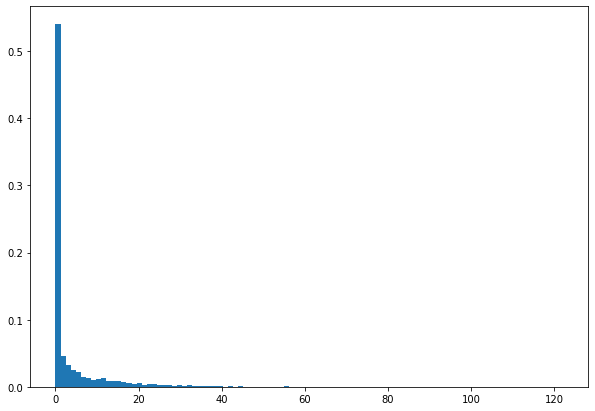

In [11]:
plt.figure(figsize=(10, 7))
plt.hist(final_frame['BDP'], bins=100, density=True)
plt.show()

In [23]:
precip_BDP = final_frame['BDP']
parameters = stats.gamma.fit(precip_BDP)
1-stats.gamma.cdf(0.3, *parameters)

0.2680466450334852

In [27]:
stats.gamma.cdf(20, *parameters) - stats.gamma.cdf(0, *parameters)

0.9999990673354612

In [28]:
stats.gamma.cdf(40, *parameters) - stats.gamma.cdf(20, *parameters)

8.869420842216869e-08

In [30]:
stats.gamma.cdf(60, *parameters) - stats.gamma.cdf(40, *parameters)

1.4643841694805815e-13

In [37]:
stats.gamma.ppf(0.95, *parameters)

1.7501900475388297